In [1]:
!pip install numpy


Defaulting to user installation because normal site-packages is not writeable


# Read the npy file

In [2]:
import numpy as np

# Specify the path to your .npy file
file_path = "./DelhiData_3hr_sample_V9_Eju.npy"

# Load the .npy file
data = np.load(file_path)

# Use the data as you need
print(data)


[[[ 2.88371143e+02  9.24701594e+01  1.12868517e+01 ...  2.12712078e+00
    3.01771577e-01  2.45503435e+02]
  [ 3.08531213e+02  7.66950000e+01  1.27500000e+01 ...  2.27545874e+00
    3.00000000e-01  1.86670000e+02]
  [ 1.45786509e+02  9.05731000e+01  1.26310958e+01 ...  2.27545874e+00
    3.50307783e-01  2.08072876e+02]
  ...
  [ 2.99935285e+02  9.09107307e+01  1.08661561e+01 ...  2.47182995e+00
    2.17875587e-01  1.55353600e+02]
  [ 2.21932266e+02  9.22395905e+01  7.28072471e+00 ...  2.27545874e+00
    4.02479375e-01  2.05377265e+02]
  [ 2.56391033e+02  9.08770181e+01  1.25169407e+01 ...  2.12712078e+00
    3.42426038e-01  2.07707649e+02]]

 [[ 2.53242414e+02  9.27631101e+01  2.89222704e+01 ...  1.06756392e+00
    3.02264733e-01  1.42233068e+02]
  [ 5.19598940e+02  8.00566667e+01  1.46666667e+01 ...  1.05484924e+00
    3.00000000e-01  8.40000000e+01]
  [ 1.25668618e+02  9.03692239e+01  4.46992929e+01 ...  1.05484924e+00
    3.21812394e-01  1.57120729e+02]
  ...
  [ 2.70341606e+02  9.1

In [3]:
data.shape

(8755, 38, 12)

In [4]:
8755/8

1094.375

In [5]:
data.shape

(8755, 38, 12)

# Daily means covariate

In [6]:
# 0- pm2.5, 1- RH, 2- SR, 3- A2MTEMP, 4- KINDEX, 5- PBL, 6- precip, 7- surf_pressure, 8- u, 9-v, 10-windx, 11- windy

In [7]:
import numpy as np

# Assuming 'data' is your dataset
data = np.array(data)  # Replace 'your_data' with your actual data

num_days = data.shape[0] // 8  # Total number of days
num_days

1094

In [8]:
data[:num_days*8, :, :].shape

(8752, 38, 12)

In [9]:
# Reshape the data to split it into days
reshaped_data = data[:num_days*8, :, :].reshape((num_days, 8, data.shape[1], data.shape[2]))

# Calculate the mean of the covariates for each day
daily_means = np.mean(reshaped_data, axis=1)

# 'daily_means' will be the array containing the mean of covariates for each day
print(daily_means)  # Display the array of daily mean covariate values

[[[ 2.03515499e+02  8.64440563e+01  7.43967195e+01 ...  4.24747065e+00
    4.51242669e-01  1.78538739e+02]
  [ 3.51943352e+02  7.16945833e+01  1.60219167e+02 ...  4.27554891e+00
    3.02500000e-01  1.44313750e+02]
  [ 9.68405726e+01  8.31859014e+01  6.77751874e+01 ...  4.27554891e+00
    5.35419889e-01  1.60821110e+02]
  ...
  [ 2.29181359e+02  8.22298376e+01  5.90277560e+01 ...  4.55121029e+00
    3.48628904e-01  1.11544120e+02]
  [ 1.85381737e+02  8.42231343e+01  7.73679375e+01 ...  4.27554891e+00
    6.54222309e-01  1.74599373e+02]
  [ 2.17277441e+02  8.34214071e+01  6.82406887e+01 ...  4.24747065e+00
    5.19401682e-01  1.66987201e+02]]

 [[ 1.77495996e+02  8.73763345e+01  8.01581853e+01 ...  3.62445122e+00
    5.04140530e-01  2.07369984e+02]
  [ 3.41588542e+02  7.19029167e+01  1.60340208e+02 ...  3.04981821e+00
    3.46250000e-01  2.06416250e+02]
  [ 9.28827577e+01  8.40407645e+01  7.51979731e+01 ...  3.04981821e+00
    6.04474409e-01  2.10322221e+02]
  ...
  [ 1.78114118e+02  8.2

In [10]:
daily_means.shape

(1094, 38, 12)

In [11]:
import pandas as pd

# Upto 2023 data collect from sattelite using kriging 

In [12]:
aod = pd.read_csv("allyear_below_33_percentage_kriging_merged_mixed.csv")
aod.head()

,latitude,longitude,2018-01-01,2018-01-02,2018-01-03,2018-01-04,2018-01-05,2018-01-06,2018-01-07,2018-01-08,...,2023-09-16,2023-09-17,2023-09-18,2023-09-19,2023-09-20,2023-09-21,2023-09-22,2023-09-23,2023-09-24,2023-09-25
0,28.414,77.171,NaN,0.322,NaN,0.816000,1.422,2.179,1.117,NaN,...,1.128,0.707,NaN,NaN,NaN,0.438,0.465,NaN,0.668,NaN
1,28.414,77.181,NaN,0.305,NaN,0.818462,1.360,2.154,1.069,NaN,...,1.141,0.648,NaN,NaN,NaN,0.412,0.391,NaN,0.600,NaN
2,28.414,77.192,NaN,0.293,NaN,0.824012,1.337,2.130,1.059,NaN,...,1.142,0.638,NaN,NaN,NaN,0.384,0.394,NaN,0.601,NaN
3,28.414,77.202,NaN,0.305,NaN,0.833312,1.314,2.129,1.047,NaN,...,1.175,0.644,NaN,NaN,NaN,0.404,0.417,NaN,0.661,NaN
4,28.414,77.213,NaN,0.319,NaN,0.848415,1.327,2.147,1.050,NaN,...,1.211,0.702,NaN,NaN,NaN,0.431,0.472,NaN,0.716,NaN


# Read monitoring system data

In [13]:
monitoring_system_data = pd.read_csv("./static_delhi_feat.csv")
monitoring_system_data

,Unnamed: 0,Staton_name,Pop Density,Very dense,Mod dense,open Forest,Latitude,Longitude
0,1,Alipur,1,0.000250,0.016659,0.020568,28.815329,77.153010
1,2,Anand_Vihar,3,0.000000,0.017812,0.028906,28.646835,77.316032
2,3,Ashok_Vihar,8,0.000250,0.016659,0.020568,28.695381,77.181665
3,4,Aya_Nagar,1,0.010440,0.054480,0.248360,28.470691,77.109936
4,5,Bawana,1,0.000250,0.016659,0.020568,28.776200,77.051074
5,6,Burari_Crossing,2,0.000000,0.050678,0.030847,28.725650,77.201157
6,7,CRRI_Mathura_Road,3,0.010440,0.054480,0.248360,28.551201,77.273574
7,8,Dr_Karni_Singh_Shooting_Range,6,0.010440,0.054480,0.248360,28.498571,77.264840
8,9,DTU,1,0.000250,0.016659,0.020568,28.750050,77.111261
9,10,Dwarka_Sector_8,3,0.005629,0.030166,0.063492,28.571027,77.071901


# Data till 2020

In [14]:
# Filter the DataFrame to get data until 2020
df_filtered = aod.loc[:, :'2020-12-31']

# Select the latitude and longitude columns along with the filtered date columns
required_columns = list(df_filtered.columns)

# Create a new DataFrame with the required columns
df_until_2020 = aod[required_columns]

# Print the DataFrame with data until 2020
print(df_until_2020)

      latitude  longitude  2018-01-01  2018-01-02  2018-01-03  2018-01-04  \
0       28.414     77.171         NaN       0.322         NaN    0.816000   
1       28.414     77.181         NaN       0.305         NaN    0.818462   
2       28.414     77.192         NaN       0.293         NaN    0.824012   
3       28.414     77.202         NaN       0.305         NaN    0.833312   
4       28.414     77.213         NaN       0.319         NaN    0.848415   
...        ...        ...         ...         ...         ...         ...   
1345    28.864     77.078         NaN       0.235         NaN    0.381000   
1346    28.864     77.088         NaN       0.246         NaN    0.373000   
1347    28.864     77.098         NaN       0.248         NaN    0.375000   
1348    28.864     77.109         NaN       0.246         NaN    0.375000   
1349    28.874     77.088         NaN       0.241         NaN    0.391000   

      2018-01-05  2018-01-06  2018-01-07  2018-01-08  ...  2020-12-22  \
0 

In [15]:
df_until_2020.to_csv("till_2018_data.csv",index= False)

In [16]:
df_until_2020

,latitude,longitude,2018-01-01,2018-01-02,2018-01-03,2018-01-04,2018-01-05,2018-01-06,2018-01-07,2018-01-08,...,2020-12-22,2020-12-23,2020-12-24,2020-12-25,2020-12-26,2020-12-27,2020-12-28,2020-12-29,2020-12-30,2020-12-31
0,28.414,77.171,NaN,0.322,NaN,0.816000,1.422000,2.179,1.117,NaN,...,NaN,0.491,NaN,NaN,NaN,0.390,0.531,NaN,0.549,NaN
1,28.414,77.181,NaN,0.305,NaN,0.818462,1.360000,2.154,1.069,NaN,...,NaN,0.493,NaN,NaN,NaN,0.368,0.515,NaN,0.530,NaN
2,28.414,77.192,NaN,0.293,NaN,0.824012,1.337000,2.130,1.059,NaN,...,NaN,0.482,NaN,NaN,NaN,0.363,0.506,NaN,0.518,NaN
3,28.414,77.202,NaN,0.305,NaN,0.833312,1.314000,2.129,1.047,NaN,...,NaN,0.483,NaN,NaN,NaN,0.375,0.505,NaN,0.525,NaN
4,28.414,77.213,NaN,0.319,NaN,0.848415,1.327000,2.147,1.050,NaN,...,NaN,0.495,NaN,NaN,NaN,0.392,0.532,NaN,0.555,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,28.864,77.078,NaN,0.235,NaN,0.381000,1.622980,1.339,1.107,NaN,...,NaN,0.476,NaN,0.566,NaN,0.402,0.419,0.686,0.605,NaN
1346,28.864,77.088,NaN,0.246,NaN,0.373000,1.633852,1.259,1.066,NaN,...,NaN,0.490,NaN,0.553,NaN,0.383,0.425,0.649,0.602,NaN
1347,28.864,77.098,NaN,0.248,NaN,0.375000,1.647527,1.258,1.055,NaN,...,NaN,0.487,NaN,NaN,NaN,0.387,0.429,0.655,0.590,NaN
1348,28.864,77.109,NaN,0.246,NaN,0.375000,1.668693,1.244,1.055,NaN,...,NaN,0.479,NaN,NaN,NaN,0.375,0.440,0.645,0.574,NaN


In [17]:
df_until_2020
sd = df_until_2020.iloc[:,0:2]
gh = df_until_2020.iloc[:,2:]
jh = np.array(gh)
jh.shape
numeric_df = np.transpose(gh)
numeric_df
data = df_until_2020
# Assuming you have a DataFrame named 'df'
sd['coordinates'] = list(zip(sd['latitude'], sd['longitude']))

# Drop the individual 'latitude' and 'longitude' columns if needed
sd.drop(['latitude', 'longitude'], axis=1, inplace=True)

# Display the DataFrame with combined coordinates
print(sd)


           coordinates
0     (28.414, 77.171)
1     (28.414, 77.181)
2     (28.414, 77.192)
3     (28.414, 77.202)
4     (28.414, 77.213)
...                ...
1345  (28.864, 77.078)
1346  (28.864, 77.088)
1347  (28.864, 77.098)
1348  (28.864, 77.109)
1349  (28.874, 77.088)

[1350 rows x 1 columns]


/tmp/ipykernel_239782/2629240892.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sd['coordinates'] = list(zip(sd['latitude'], sd['longitude']))
/tmp/ipykernel_239782/2629240892.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sd.drop(['latitude', 'longitude'], axis=1, inplace=True)


In [18]:
sd["coordinates"].values
# Rename the columns of numeric_df to match the index of coordinates_df
numeric_df.columns = sd["coordinates"].values

# Display the DataFrame with renamed columns
#print(numeric_df)
numeric_df

,"(28.414, 77.171)","(28.414, 77.181)","(28.414, 77.192)","(28.414, 77.202)","(28.414, 77.213)","(28.414, 77.223)","(28.424, 77.171)","(28.424, 77.181)","(28.424, 77.192)","(28.424, 77.202)",...,"(28.854, 77.181)","(28.854, 77.192)","(28.854, 77.202)","(28.864, 77.057)","(28.864, 77.067)","(28.864, 77.078)","(28.864, 77.088)","(28.864, 77.098)","(28.864, 77.109)","(28.874, 77.088)"
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,0.322,0.305000,0.293000,0.305000,0.319000,0.331000,0.328,0.328,0.317000,0.307000,...,0.267,0.302,0.334,0.268000,0.239000,0.23500,0.246000,0.248000,0.246000,0.241000
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,0.816,0.818462,0.824012,0.833312,0.848415,0.866302,0.806,0.807,0.824012,0.833312,...,0.384,0.411,0.416,0.372000,0.381000,0.38100,0.373000,0.375000,0.375000,0.391000
2018-01-05,1.422,1.360000,1.337000,1.314000,1.327000,1.362000,1.476,1.430,1.372000,1.348000,...,1.875,1.893,1.906,1.605431,1.613093,1.62298,1.633852,1.647527,1.668693,1.633852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,0.390,0.368000,0.363000,0.375000,0.392000,0.406000,0.426,0.407,0.372000,0.358000,...,0.427,0.401,0.410,0.386000,0.393000,0.40200,0.383000,0.387000,0.375000,0.387000
2020-12-28,0.531,0.515000,0.506000,0.505000,0.532000,0.565000,0.564,0.538,0.513000,0.500000,...,0.537,0.565,0.595,0.452000,0.430000,0.41900,0.425000,0.429000,0.440000,0.409000
2020-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.657,0.651,0.675000,0.683000,0.68600,0.649000,0.655000,0.645000,0.684000
2020-12-30,0.549,0.530000,0.518000,0.525000,0.555000,0.601000,0.596,0.561,0.536000,0.524000,...,0.616,0.657,0.690,0.574000,0.600000,0.60500,0.602000,0.590000,0.574000,0.608000


In [19]:
numeric_df.shape

(1096, 1350)

In [20]:
numeric_df.columns

Index([(28.414, 77.171), (28.414, 77.181), (28.414, 77.192), (28.414, 77.202),
       (28.414, 77.213), (28.414, 77.223), (28.424, 77.171), (28.424, 77.181),
       (28.424, 77.192), (28.424, 77.202),
       ...
       (28.854, 77.181), (28.854, 77.192), (28.854, 77.202), (28.864, 77.057),
       (28.864, 77.067), (28.864, 77.078), (28.864, 77.088), (28.864, 77.098),
       (28.864, 77.109), (28.874, 77.088)],
      dtype='object', length=1350)

In [21]:
numeric_df[(28.414, 77.171)]

2018-01-01      NaN
2018-01-02    0.322
2018-01-03      NaN
2018-01-04    0.816
2018-01-05    1.422
              ...  
2020-12-27    0.390
2020-12-28    0.531
2020-12-29      NaN
2020-12-30    0.549
2020-12-31      NaN
Name: (28.414, 77.171), Length: 1096, dtype: float64

In [22]:
numeric_df[(28.414, 77.171)]

2018-01-01      NaN
2018-01-02    0.322
2018-01-03      NaN
2018-01-04    0.816
2018-01-05    1.422
              ...  
2020-12-27    0.390
2020-12-28    0.531
2020-12-29      NaN
2020-12-30    0.549
2020-12-31      NaN
Name: (28.414, 77.171), Length: 1096, dtype: float64

# Find which satellite data is near in the monitoring system data 

In [23]:
monitoring_system_data

,Unnamed: 0,Staton_name,Pop Density,Very dense,Mod dense,open Forest,Latitude,Longitude
0,1,Alipur,1,0.000250,0.016659,0.020568,28.815329,77.153010
1,2,Anand_Vihar,3,0.000000,0.017812,0.028906,28.646835,77.316032
2,3,Ashok_Vihar,8,0.000250,0.016659,0.020568,28.695381,77.181665
3,4,Aya_Nagar,1,0.010440,0.054480,0.248360,28.470691,77.109936
4,5,Bawana,1,0.000250,0.016659,0.020568,28.776200,77.051074
5,6,Burari_Crossing,2,0.000000,0.050678,0.030847,28.725650,77.201157
6,7,CRRI_Mathura_Road,3,0.010440,0.054480,0.248360,28.551201,77.273574
7,8,Dr_Karni_Singh_Shooting_Range,6,0.010440,0.054480,0.248360,28.498571,77.264840
8,9,DTU,1,0.000250,0.016659,0.020568,28.750050,77.111261
9,10,Dwarka_Sector_8,3,0.005629,0.030166,0.063492,28.571027,77.071901


In [24]:
monitoring_system_data["Staton_name"]

0                                 Alipur
1                            Anand_Vihar
2                            Ashok_Vihar
3                              Aya_Nagar
4                                 Bawana
5                        Burari_Crossing
6                      CRRI_Mathura_Road
7          Dr_Karni_Singh_Shooting_Range
8                                    DTU
9                        Dwarka_Sector_8
10                      East_Arjun_Nagar
11                        IGI_Airport_T3
12                                 IHBAS
13                                   ITO
14                          Jahangirpuri
15              Jawaharlal_Nehru_Stadium
16                            Lodhi_Road
17    Major_Dhyan_Chand_National_Stadium
18                           Mandir_Marg
19                                Mundka
20                             Najafgarh
21                                Narela
22                           Nehru_Nagar
23                          North_Campus
24              

In [25]:
mon_location = monitoring_system_data[["Latitude","Longitude"]]
mon_location

,Latitude,Longitude
0,28.815329,77.153010
1,28.646835,77.316032
2,28.695381,77.181665
3,28.470691,77.109936
4,28.776200,77.051074
5,28.725650,77.201157
6,28.551201,77.273574
7,28.498571,77.264840
8,28.750050,77.111261
9,28.571027,77.071901


In [26]:
satellite_data = numeric_df
satellite_data.head(2)

,"(28.414, 77.171)","(28.414, 77.181)","(28.414, 77.192)","(28.414, 77.202)","(28.414, 77.213)","(28.414, 77.223)","(28.424, 77.171)","(28.424, 77.181)","(28.424, 77.192)","(28.424, 77.202)",...,"(28.854, 77.181)","(28.854, 77.192)","(28.854, 77.202)","(28.864, 77.057)","(28.864, 77.067)","(28.864, 77.078)","(28.864, 77.088)","(28.864, 77.098)","(28.864, 77.109)","(28.874, 77.088)"
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,0.322,0.305,0.293,0.305,0.319,0.331,0.328,0.328,0.317,0.307,...,0.267,0.302,0.334,0.268,0.239,0.235,0.246,0.248,0.246,0.241


In [27]:
satellite_coords =satellite_data.columns
satellite_coords

Index([(28.414, 77.171), (28.414, 77.181), (28.414, 77.192), (28.414, 77.202),
       (28.414, 77.213), (28.414, 77.223), (28.424, 77.171), (28.424, 77.181),
       (28.424, 77.192), (28.424, 77.202),
       ...
       (28.854, 77.181), (28.854, 77.192), (28.854, 77.202), (28.864, 77.057),
       (28.864, 77.067), (28.864, 77.078), (28.864, 77.088), (28.864, 77.098),
       (28.864, 77.109), (28.874, 77.088)],
      dtype='object', length=1350)

In [28]:
import pandas as pd
from math import radians, cos, sin, asin, sqrt

# Define the haversine formula
def haversine(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * asin(sqrt(a))
    r = 6371  # Radius of the Earth in kilometers
    return c * r

In [29]:
# Create a new column to store the nearby satellite coordinates
mon_location['Nearby_Satellite_Coordinate'] = [None] * len(mon_location['Latitude'])

# Find the closest satellite coordinate for each monitoring location
for index, row in enumerate(mon_location['Latitude']):
    min_distance = float('inf')
    closest_satellite = None
    for sat_coord in satellite_coords:
        distance = haversine(row, mon_location['Longitude'][index], sat_coord[0], sat_coord[1])
        if distance < min_distance:
            min_distance = distance
            closest_satellite = sat_coord
    mon_location['Nearby_Satellite_Coordinate'][index] = closest_satellite

# Create a DataFrame from the updated data
mon_satellite = pd.DataFrame(mon_location)

# Display the DataFrame
print(mon_satellite.head(2))

/tmp/ipykernel_239782/4014535110.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mon_location['Nearby_Satellite_Coordinate'] = [None] * len(mon_location['Latitude'])
/tmp/ipykernel_239782/4014535110.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mon_location['Nearby_Satellite_Coordinate'][index] = closest_satellite
/tmp/ipykernel_239782/4014535110.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#re

    Latitude  Longitude Nearby_Satellite_Coordinate
0  28.815329  77.153010             (28.815, 77.15)
1  28.646835  77.316032            (28.649, 77.316)


/tmp/ipykernel_239782/4014535110.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mon_location['Nearby_Satellite_Coordinate'][index] = closest_satellite
/tmp/ipykernel_239782/4014535110.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mon_location['Nearby_Satellite_Coordinate'][index] = closest_satellite
/tmp/ipykernel_239782/4014535110.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mon_location['Nearby_Satellite_Coordina

In [30]:
mon_satellite

,Latitude,Longitude,Nearby_Satellite_Coordinate
0,28.815329,77.153010,"(28.815, 77.15)"
1,28.646835,77.316032,"(28.649, 77.316)"
2,28.695381,77.181665,"(28.698, 77.181)"
3,28.470691,77.109936,"(28.473, 77.119)"
4,28.776200,77.051074,"(28.776, 77.046)"
5,28.725650,77.201157,"(28.727, 77.202)"
6,28.551201,77.273574,"(28.551, 77.275)"
7,28.498571,77.264840,"(28.502, 77.264)"
8,28.750050,77.111261,"(28.747, 77.109)"
9,28.571027,77.071901,"(28.571, 77.067)"


In [31]:
satellite_data.head(2)

,"(28.414, 77.171)","(28.414, 77.181)","(28.414, 77.192)","(28.414, 77.202)","(28.414, 77.213)","(28.414, 77.223)","(28.424, 77.171)","(28.424, 77.181)","(28.424, 77.192)","(28.424, 77.202)",...,"(28.854, 77.181)","(28.854, 77.192)","(28.854, 77.202)","(28.864, 77.057)","(28.864, 77.067)","(28.864, 77.078)","(28.864, 77.088)","(28.864, 77.098)","(28.864, 77.109)","(28.874, 77.088)"
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,0.322,0.305,0.293,0.305,0.319,0.331,0.328,0.328,0.317,0.307,...,0.267,0.302,0.334,0.268,0.239,0.235,0.246,0.248,0.246,0.241


# Find the aod value of the monitoring system 

In [32]:
aod_monitoring_system_data = satellite_data[mon_satellite["Nearby_Satellite_Coordinate"]]

In [33]:
aod_monitoring_system_data.head(2)

,"(28.815, 77.15)","(28.649, 77.316)","(28.698, 77.181)","(28.473, 77.119)","(28.776, 77.046)","(28.727, 77.202)","(28.551, 77.275)","(28.502, 77.264)","(28.747, 77.109)","(28.571, 77.067)",...,"(28.639, 77.15)","(28.649, 77.171)","(28.678, 77.129)","(28.737, 77.119)","(28.649, 77.15)","(28.551, 77.213)","(28.707, 77.254)","(28.531, 77.192)","(28.668, 77.316)","(28.698, 77.161)"
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,0.287,0.532,0.329,0.307,0.291,0.273,0.414,0.364,0.279,0.309,...,0.36,0.346,0.403,0.355,0.359,0.442,0.359,0.405,0.395,0.35


In [34]:
aod_monitoring_system_data

,"(28.815, 77.15)","(28.649, 77.316)","(28.698, 77.181)","(28.473, 77.119)","(28.776, 77.046)","(28.727, 77.202)","(28.551, 77.275)","(28.502, 77.264)","(28.747, 77.109)","(28.571, 77.067)",...,"(28.639, 77.15)","(28.649, 77.171)","(28.678, 77.129)","(28.737, 77.119)","(28.649, 77.15)","(28.551, 77.213)","(28.707, 77.254)","(28.531, 77.192)","(28.668, 77.316)","(28.698, 77.161)"
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,0.287,0.532000,0.329,0.307,0.291,0.273,0.414000,0.364000,0.279,0.309,...,0.360,0.346,0.403,0.355,0.359,0.442,0.359,0.405000,0.395,0.350
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,0.421,0.799000,0.605,0.663,0.386,0.550,0.942536,0.932045,0.445,0.549,...,0.631,0.634,0.607,0.474,0.637,0.759,0.678,0.727000,0.744,0.596
2018-01-05,1.832,1.279811,1.762,1.666,1.847,1.604,1.566000,1.475000,1.681,1.596,...,1.622,1.602,1.825,1.754,1.626,1.745,1.576,1.711000,1.712,1.693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,0.474,0.528000,0.476,0.396,0.447,0.412,0.493000,0.382000,0.487,0.450,...,0.458,0.468,0.519,0.407,0.459,0.530,0.450,0.508000,0.441,0.523
2020-12-28,0.520,0.480425,0.489,0.586,0.509,0.474,0.525000,0.467000,0.537,0.501,...,0.550,0.536,0.577,0.480,0.513,0.664,0.468,0.577285,0.592,0.544
2020-12-29,NaN,0.902000,0.746,0.693,0.699,0.730,0.788000,NaN,NaN,NaN,...,0.736,0.765,NaN,0.686,0.746,0.689,0.773,0.698000,0.908,0.747
2020-12-30,0.659,0.538649,0.568,0.665,0.698,0.561,0.545000,0.527000,0.679,0.633,...,0.663,0.631,0.670,0.601,0.628,0.813,0.595,0.671000,0.645,0.621


In [35]:
aod_monitoring_system_data.shape

(1096, 38)

In [36]:
#checking first 10 day data

In [37]:
aod_monitoring_system_data[(28.815, 77.15)][0:10]

2018-01-01      NaN
2018-01-02    0.287
2018-01-03      NaN
2018-01-04    0.421
2018-01-05    1.832
2018-01-06    1.336
2018-01-07    1.174
2018-01-08      NaN
2018-01-09    0.744
2018-01-10      NaN
Name: (28.815, 77.15), dtype: float64

In [38]:
aod_monitoring_system_data.head(3)

,"(28.815, 77.15)","(28.649, 77.316)","(28.698, 77.181)","(28.473, 77.119)","(28.776, 77.046)","(28.727, 77.202)","(28.551, 77.275)","(28.502, 77.264)","(28.747, 77.109)","(28.571, 77.067)",...,"(28.639, 77.15)","(28.649, 77.171)","(28.678, 77.129)","(28.737, 77.119)","(28.649, 77.15)","(28.551, 77.213)","(28.707, 77.254)","(28.531, 77.192)","(28.668, 77.316)","(28.698, 77.161)"
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,0.287,0.532,0.329,0.307,0.291,0.273,0.414,0.364,0.279,0.309,...,0.36,0.346,0.403,0.355,0.359,0.442,0.359,0.405,0.395,0.35
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
# Retrieve the first 1094 rows
aod_monitoring_system_data_first_1094 = aod_monitoring_system_data.head(1094)

# Display the first 1094 rows
print(aod_monitoring_system_data_first_1094)

            (28.815, 77.15)  (28.649, 77.316)  (28.698, 77.181)  \
2018-01-01              NaN               NaN               NaN   
2018-01-02            0.287          0.532000             0.329   
2018-01-03              NaN               NaN               NaN   
2018-01-04            0.421          0.799000             0.605   
2018-01-05            1.832          1.279811             1.762   
...                     ...               ...               ...   
2020-12-25              NaN               NaN               NaN   
2020-12-26              NaN               NaN               NaN   
2020-12-27            0.474          0.528000             0.476   
2020-12-28            0.520          0.480425             0.489   
2020-12-29              NaN          0.902000             0.746   

            (28.473, 77.119)  (28.776, 77.046)  (28.727, 77.202)  \
2018-01-01               NaN               NaN               NaN   
2018-01-02             0.307             0.291             

In [40]:
aod_monitoring_system_data_first_1094.shape

(1094, 38)

In [41]:
daily_means.shape

(1094, 38, 12)

In [42]:
aod_monitoring_system_data_first_1094.shape

(1094, 38)

In [43]:
aod_monitoring_system_data_first_1094 = np.array(aod_monitoring_system_data_first_1094)
aod_monitoring_system_data_first_1094.shape

(1094, 38)

In [44]:
aod_monitoring_system_data_first_1094

array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [0.287     , 0.532     , 0.329     , ..., 0.405     , 0.395     ,
        0.35      ],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.474     , 0.528     , 0.476     , ..., 0.508     , 0.441     ,
        0.523     ],
       [0.52      , 0.48042487, 0.489     , ..., 0.57728544, 0.592     ,
        0.544     ],
       [       nan, 0.902     , 0.746     , ..., 0.698     , 0.908     ,
        0.747     ]])

In [45]:
aod_monitoring_system_data_first_1094[:, :, np.newaxis].shape

(1094, 38, 1)

In [46]:
import numpy as np

# Assuming daily_means and aod_monitoring_system_data_first_1094 are your data arrays
# Concatenate the arrays along the last axis
combined_data = np.concatenate((daily_means, aod_monitoring_system_data_first_1094[:, :, np.newaxis]), axis=2)

# Display the shape of the combined array
print(combined_data.shape)

(1094, 38, 13)


In [47]:
combined_data[0:5,0:5,12]

array([[       nan,        nan,        nan,        nan,        nan],
       [0.287     , 0.532     , 0.329     , 0.307     , 0.291     ],
       [       nan,        nan,        nan,        nan,        nan],
       [0.421     , 0.799     , 0.605     , 0.663     , 0.386     ],
       [1.832     , 1.27981129, 1.762     , 1.666     , 1.847     ]])

In [48]:
combined_data

array([[[2.03515499e+02, 8.64440563e+01, 7.43967195e+01, ...,
         4.51242669e-01, 1.78538739e+02,            nan],
        [3.51943352e+02, 7.16945833e+01, 1.60219167e+02, ...,
         3.02500000e-01, 1.44313750e+02,            nan],
        [9.68405726e+01, 8.31859014e+01, 6.77751874e+01, ...,
         5.35419889e-01, 1.60821110e+02,            nan],
        ...,
        [2.29181359e+02, 8.22298376e+01, 5.90277560e+01, ...,
         3.48628904e-01, 1.11544120e+02,            nan],
        [1.85381737e+02, 8.42231343e+01, 7.73679375e+01, ...,
         6.54222309e-01, 1.74599373e+02,            nan],
        [2.17277441e+02, 8.34214071e+01, 6.82406887e+01, ...,
         5.19401682e-01, 1.66987201e+02,            nan]],

       [[1.77495996e+02, 8.73763345e+01, 8.01581853e+01, ...,
         5.04140530e-01, 2.07369984e+02, 2.87000000e-01],
        [3.41588542e+02, 7.19029167e+01, 1.60340208e+02, ...,
         3.46250000e-01, 2.06416250e+02, 5.32000000e-01],
        [9.28827577e+01, 

In [49]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

In [50]:
X.shape

(1094, 38, 12)

In [51]:
y.shape

(1094, 38)

In [52]:
predicted_aod.shape

(1094, 38)

In [53]:
predicted_aod

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [54]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

# Create a list to store R-squared values
r_squared_values = []

# Iterate over each location and fit linear regression to predict AOD
for i in range(y.shape[1]):
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit linear regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the linear regression model
            model = LinearRegression()
            model.fit(X_valid, y_valid)

            # Calculate R-squared value
            r_squared = model.score(X_valid, y_valid)
            r_squared_values.append(r_squared)

            # Predict AOD values where AOD is NaN
            predicted_aod[j, i] = model.predict(X[j, i, :].reshape(1, -1))

# Display the predicted AOD values
print(predicted_aod)

# Print the R-squared value
print("R-squared value: ", np.mean(r_squared_values))

[[0.73612885 1.00071412 0.75839989 ... 0.7437926  1.02610234 0.98317008]
 [0.82198581 1.04236745 0.73968231 ... 0.82465685 0.90404384 0.94980644]
 [0.81757806 0.83737606 0.70325216 ... 0.71848946 0.73725856 0.85156939]
 ...
 [0.75805935 0.86507403 0.76763129 ... 0.80675754 0.9835334  0.92962368]
 [0.6429304  0.53737257 0.56496756 ... 0.88843359 0.56276876 0.50165815]
 [0.7458062  0.62455443 0.65310168 ... 0.8301766  0.61179899 0.51984637]]
R-squared value:  0.2919939297061405


In [55]:
predicted_aod

array([[0.73612885, 1.00071412, 0.75839989, ..., 0.7437926 , 1.02610234,
        0.98317008],
       [0.82198581, 1.04236745, 0.73968231, ..., 0.82465685, 0.90404384,
        0.94980644],
       [0.81757806, 0.83737606, 0.70325216, ..., 0.71848946, 0.73725856,
        0.85156939],
       ...,
       [0.75805935, 0.86507403, 0.76763129, ..., 0.80675754, 0.9835334 ,
        0.92962368],
       [0.6429304 , 0.53737257, 0.56496756, ..., 0.88843359, 0.56276876,
        0.50165815],
       [0.7458062 , 0.62455443, 0.65310168, ..., 0.8301766 , 0.61179899,
        0.51984637]])

In [56]:
predicted_aod.shape

(1094, 38)

In [57]:
monitoring_system_data["Staton_name"]

0                                 Alipur
1                            Anand_Vihar
2                            Ashok_Vihar
3                              Aya_Nagar
4                                 Bawana
5                        Burari_Crossing
6                      CRRI_Mathura_Road
7          Dr_Karni_Singh_Shooting_Range
8                                    DTU
9                        Dwarka_Sector_8
10                      East_Arjun_Nagar
11                        IGI_Airport_T3
12                                 IHBAS
13                                   ITO
14                          Jahangirpuri
15              Jawaharlal_Nehru_Stadium
16                            Lodhi_Road
17    Major_Dhyan_Chand_National_Stadium
18                           Mandir_Marg
19                                Mundka
20                             Najafgarh
21                                Narela
22                           Nehru_Nagar
23                          North_Campus
24              

# Fit the linear regression

In [58]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

# Create a list to store R-squared values
r_squared_values = []

# Iterate over each location and fit linear regression to predict AOD
for i in range(y.shape[1]):
    station_r_squared_values = []  # List to store R-squared values for each station
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit linear regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the linear regression model
            model = LinearRegression()
            model.fit(X_valid, y_valid)

            # Calculate R-squared value
            r_squared = model.score(X_valid, y_valid)
            station_r_squared_values.append(r_squared)

            # Predict AOD values where AOD is NaN
            predicted_aod[j, i] = model.predict(X[j, i, :].reshape(1, -1))

    # Print the R-squared value for the current station
    print(f"R-squared value for station {i + 1}: {np.mean(station_r_squared_values)}")
    r_squared_values.append(station_r_squared_values)

# Display the predicted AOD values
print(predicted_aod)

# Print the average R-squared value for all stations
print(f"Average R-squared value for all stations: {np.mean(r_squared_values)}")


R-squared value for station 1: 0.2896929820970111
R-squared value for station 2: 0.2918550079135832
R-squared value for station 3: 0.3272913315003035
R-squared value for station 4: 0.2765025153454843
R-squared value for station 5: 0.35122757035416147
R-squared value for station 6: 0.3196767149573183
R-squared value for station 7: 0.2990472821573362
R-squared value for station 8: 0.3528508830670422
R-squared value for station 9: 0.3521028152702304
R-squared value for station 10: 0.30619655537101576
R-squared value for station 11: 0.2942571870682689
R-squared value for station 12: 0.31251768016406234
R-squared value for station 13: 0.29375615796587035
R-squared value for station 14: 0.35899003069118673
R-squared value for station 15: 0.3232233074482311
R-squared value for station 16: 0.2800365265790063
R-squared value for station 17: 0.2756606790340974
R-squared value for station 18: 0.2533769135247057
R-squared value for station 19: 0.3159379661562999
R-squared value for station 20: 0.2

In [59]:
combined_data

array([[[2.03515499e+02, 8.64440563e+01, 7.43967195e+01, ...,
         4.51242669e-01, 1.78538739e+02,            nan],
        [3.51943352e+02, 7.16945833e+01, 1.60219167e+02, ...,
         3.02500000e-01, 1.44313750e+02,            nan],
        [9.68405726e+01, 8.31859014e+01, 6.77751874e+01, ...,
         5.35419889e-01, 1.60821110e+02,            nan],
        ...,
        [2.29181359e+02, 8.22298376e+01, 5.90277560e+01, ...,
         3.48628904e-01, 1.11544120e+02,            nan],
        [1.85381737e+02, 8.42231343e+01, 7.73679375e+01, ...,
         6.54222309e-01, 1.74599373e+02,            nan],
        [2.17277441e+02, 8.34214071e+01, 6.82406887e+01, ...,
         5.19401682e-01, 1.66987201e+02,            nan]],

       [[1.77495996e+02, 8.73763345e+01, 8.01581853e+01, ...,
         5.04140530e-01, 2.07369984e+02, 2.87000000e-01],
        [3.41588542e+02, 7.19029167e+01, 1.60340208e+02, ...,
         3.46250000e-01, 2.06416250e+02, 5.32000000e-01],
        [9.28827577e+01, 

In [60]:
# R-square value

In [61]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

# Create a dictionary to store R-squared values for each station
r_squared_values = {}

# Iterate over each location and fit linear regression to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    station_r_squared_values = []  # List to store R-squared values for each station
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit linear regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the linear regression model
            model = LinearRegression()
            model.fit(X_valid, y_valid)

            # Calculate R-squared value
            r_squared = model.score(X_valid, y_valid)
            station_r_squared_values.append(r_squared)

            # Predict AOD values where AOD is NaN
            predicted_aod[j, i] = model.predict(X[j, i, :].reshape(1, -1))

    # Store the R-squared value for the current station
    r_squared_values[station] = np.mean(station_r_squared_values)

# Print the R-squared values for each station
for station, r_squared in r_squared_values.items():
    print(f"R-squared value for station {station}: {r_squared}")

# Display the predicted AOD values
print(predicted_aod)

# Print the average R-squared value for all stations
print(f"Average R-squared value for all stations: {np.mean(list(r_squared_values.values()))}")


R-squared value for station Alipur: 0.2896929820970111
R-squared value for station Anand_Vihar: 0.2918550079135832
R-squared value for station Ashok_Vihar: 0.3272913315003035
R-squared value for station Aya_Nagar: 0.2765025153454843
R-squared value for station Bawana: 0.35122757035416147
R-squared value for station Burari_Crossing: 0.3196767149573183
R-squared value for station CRRI_Mathura_Road: 0.2990472821573362
R-squared value for station Dr_Karni_Singh_Shooting_Range: 0.3528508830670422
R-squared value for station DTU: 0.3521028152702304
R-squared value for station Dwarka_Sector_8: 0.30619655537101576
R-squared value for station East_Arjun_Nagar: 0.2942571870682689
R-squared value for station IGI_Airport_T3: 0.31251768016406234
R-squared value for station IHBAS: 0.29375615796587035
R-squared value for station ITO: 0.35899003069118673
R-squared value for station Jahangirpuri: 0.3232233074482311
R-squared value for station Jawaharlal_Nehru_Stadium: 0.2800365265790063
R-squared value

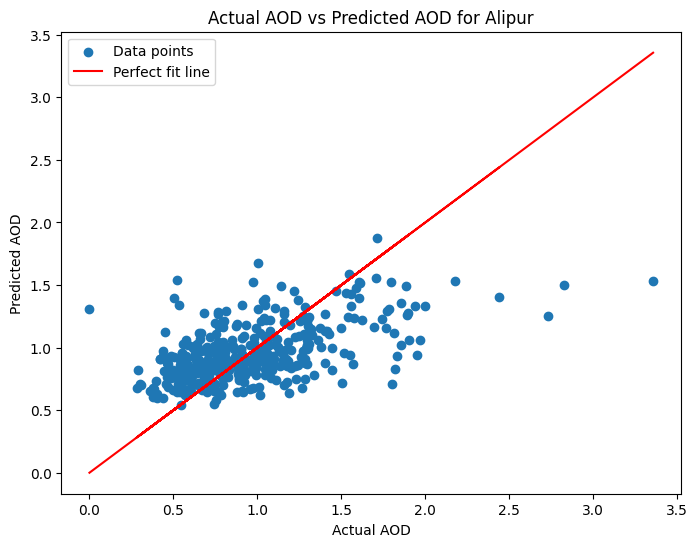

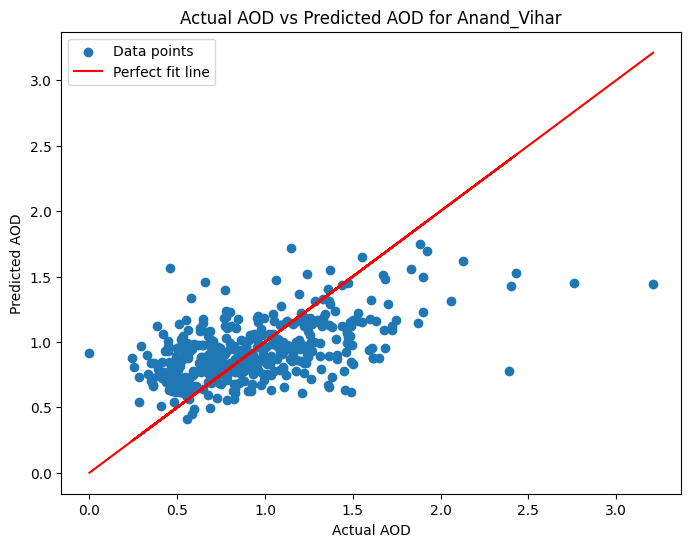

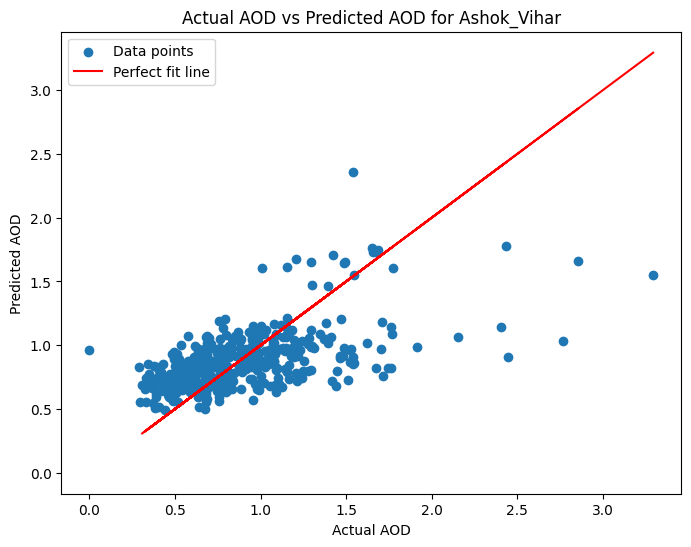

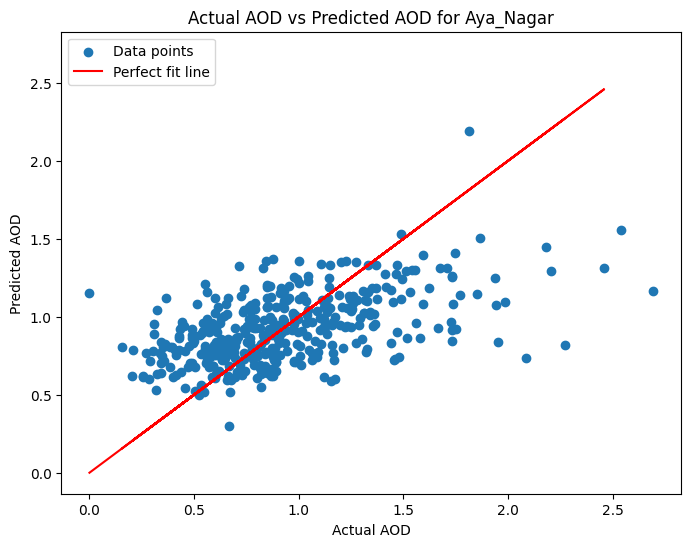

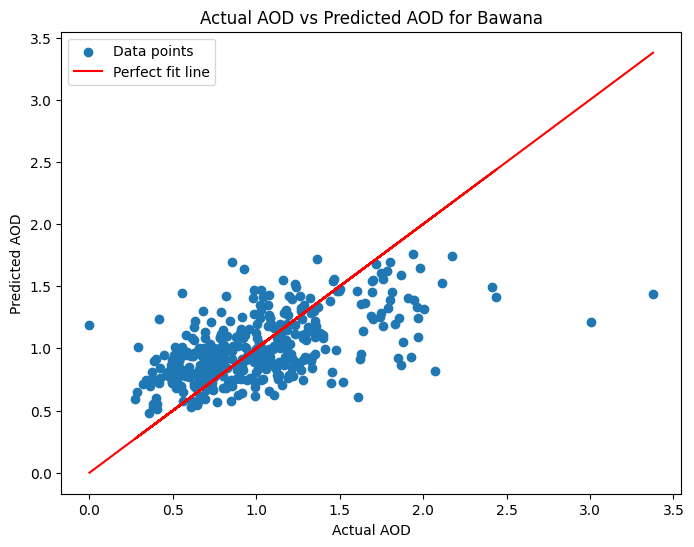

...

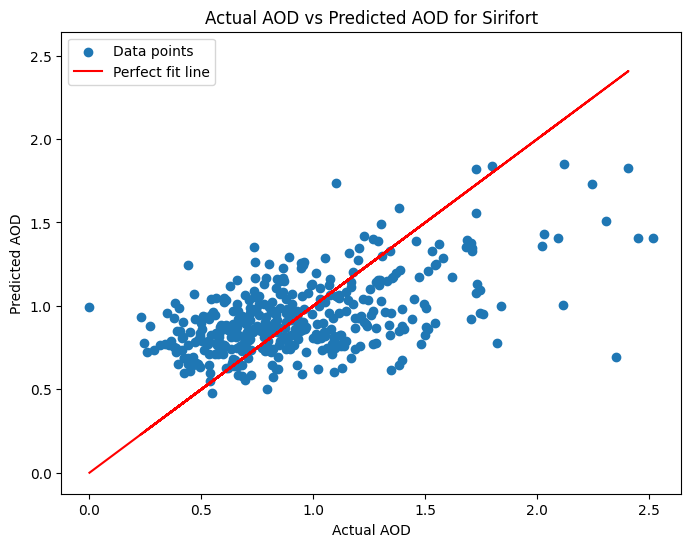

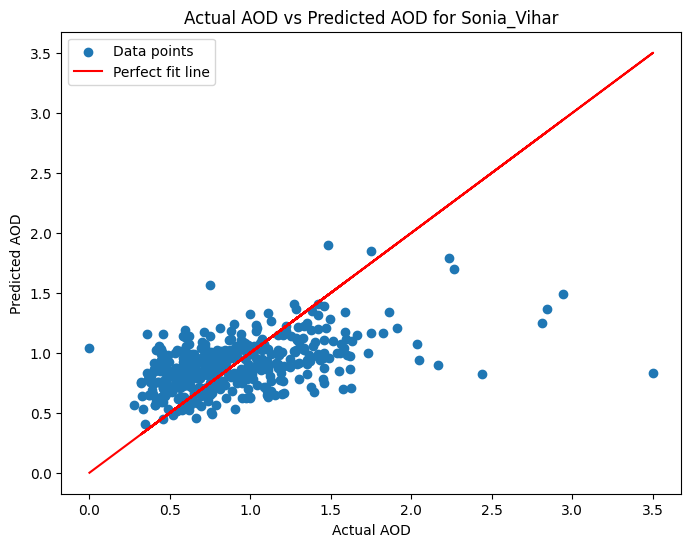

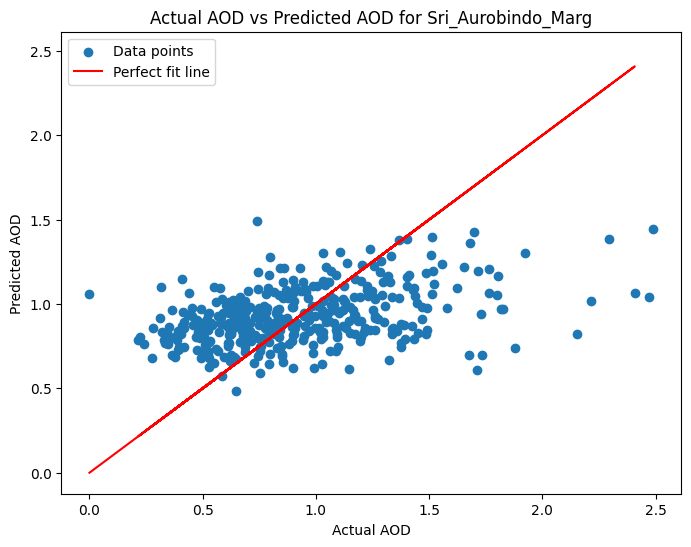

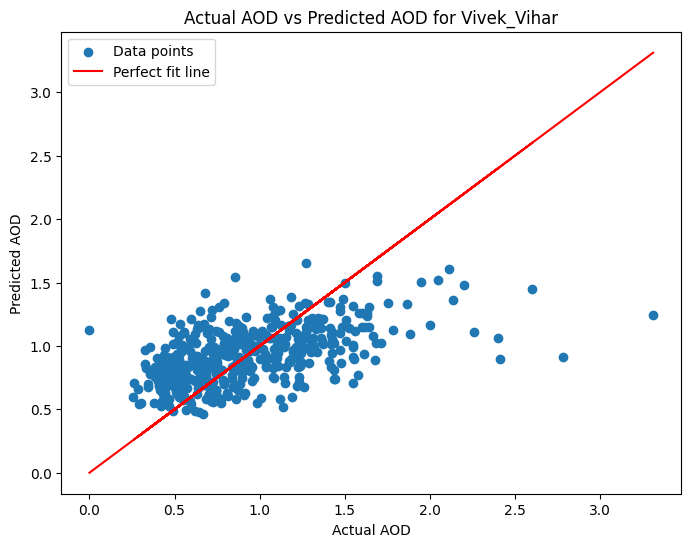

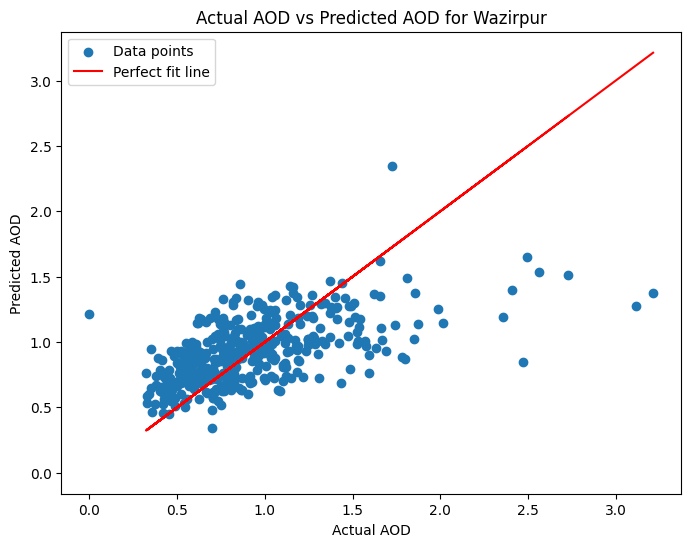

In [62]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Iterate over each location and fit linear regression to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    predicted_aod_values = []
    actual_aod_values = []
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit linear regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the linear regression model
            model = LinearRegression()
            model.fit(X_valid, y_valid)

            # Predict AOD values where AOD is NaN
            predicted_aod_value = model.predict(X[j, i, :].reshape(1, -1))
            actual_aod_value = y[j, i]
            predicted_aod_values.append(predicted_aod_value)
            actual_aod_values.append(actual_aod_value)

    # Plot the actual AOD values against the predicted AOD values for the current station
    plt.figure(figsize=(8, 6))
    plt.scatter(actual_aod_values, predicted_aod_values, label='Data points')
    plt.plot(actual_aod_values, actual_aod_values, color='r', label='Perfect fit line')
    plt.xlabel('Actual AOD')
    plt.ylabel('Predicted AOD')
    plt.title(f'Actual AOD vs Predicted AOD for {station}')
    plt.legend()
    plt.show()


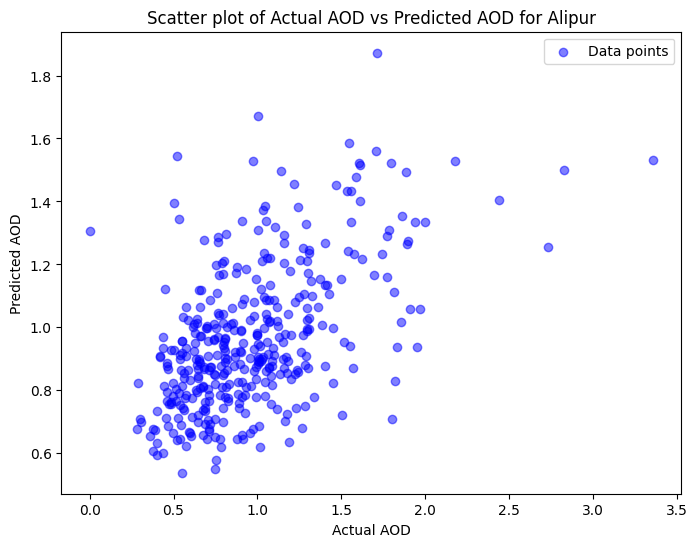

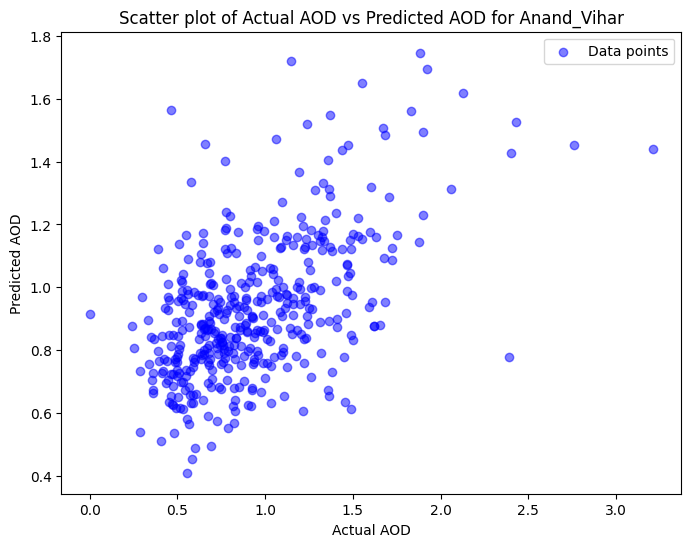

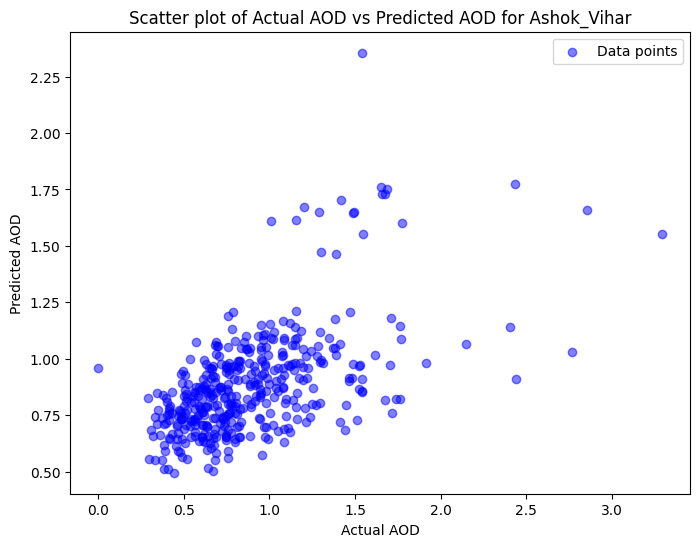

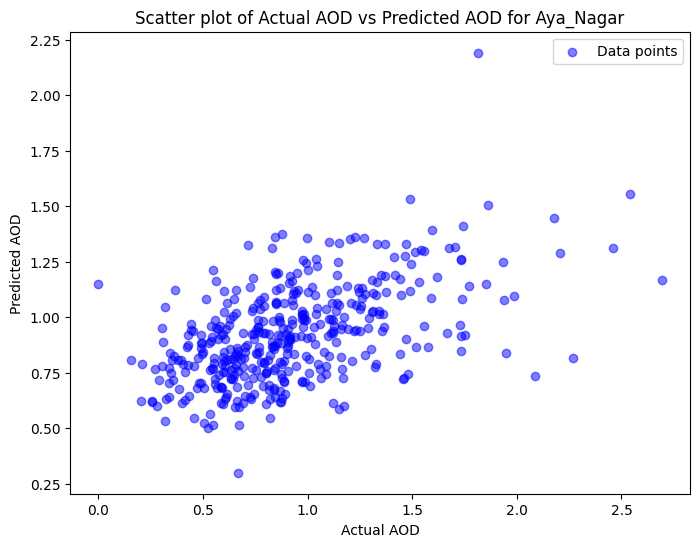

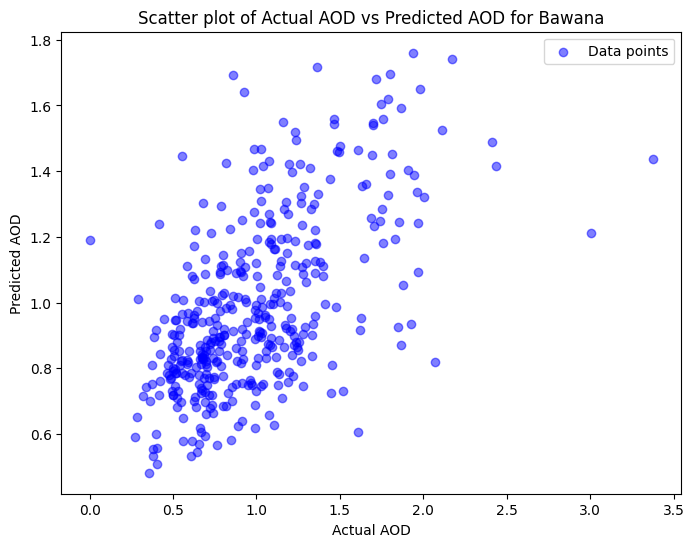

...

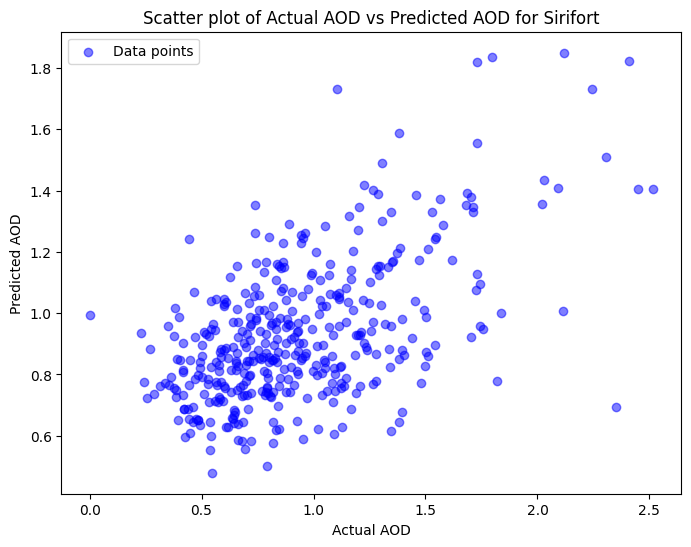

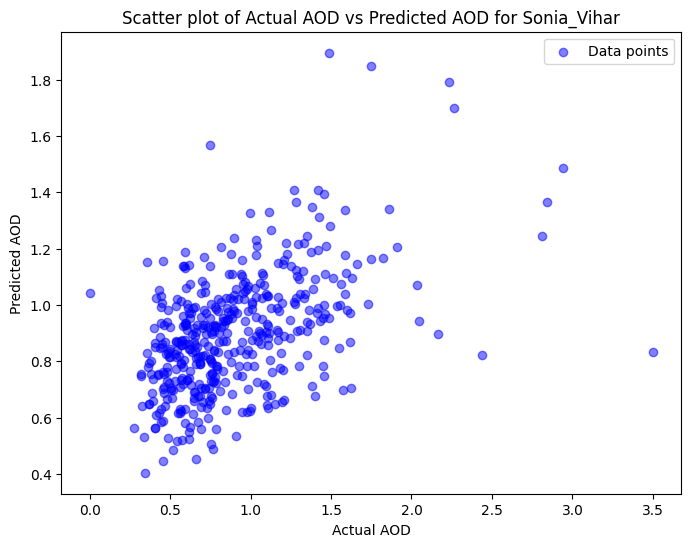

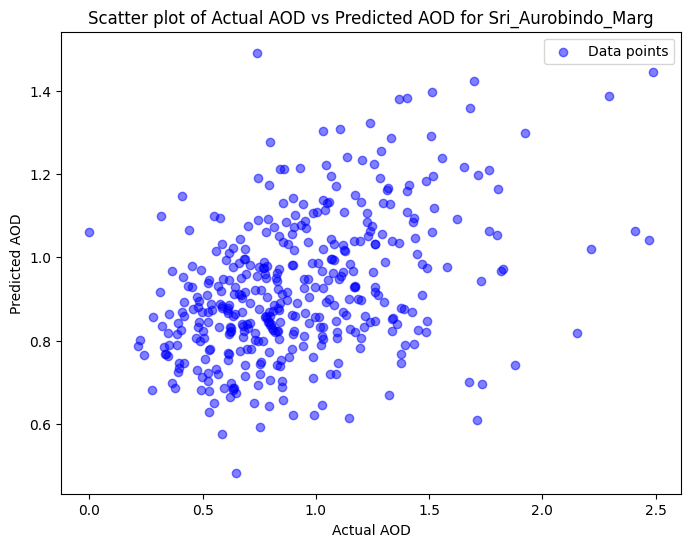

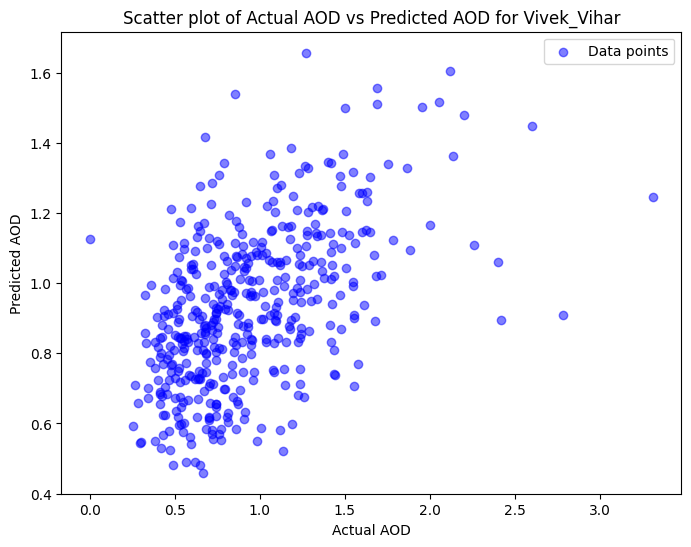

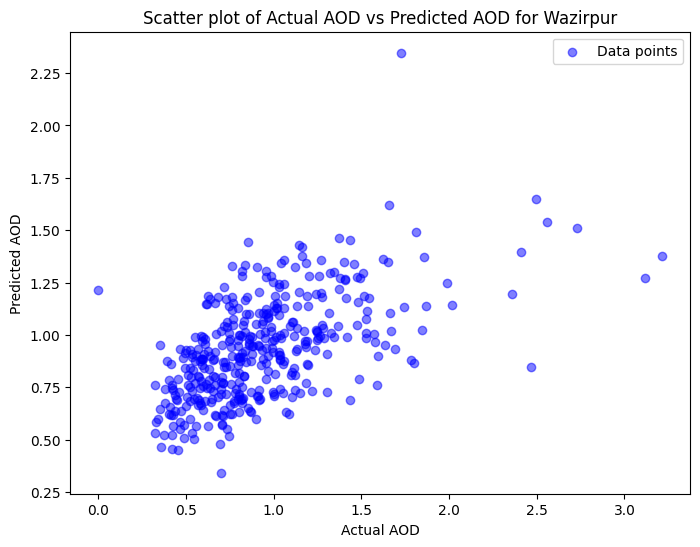

In [63]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Iterate over each location and fit linear regression to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    predicted_aod_values = []
    actual_aod_values = []
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit linear regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the linear regression model
            model = LinearRegression()
            model.fit(X_valid, y_valid)

            # Predict AOD values where AOD is NaN
            predicted_aod_value = model.predict(X[j, i, :].reshape(1, -1))
            actual_aod_value = y[j, i]
            predicted_aod_values.append(predicted_aod_value)
            actual_aod_values.append(actual_aod_value)

    # Create a scatter plot of actual AOD values against predicted AOD values for the current station
    plt.figure(figsize=(8, 6))
    plt.scatter(actual_aod_values, predicted_aod_values, label='Data points', alpha=0.5, color='b')
    plt.xlabel('Actual AOD')
    plt.ylabel('Predicted AOD')
    plt.title(f'Scatter plot of Actual AOD vs Predicted AOD for {station}')
    plt.legend()
    plt.show()


In [64]:
# Time series plot actual vs predicted

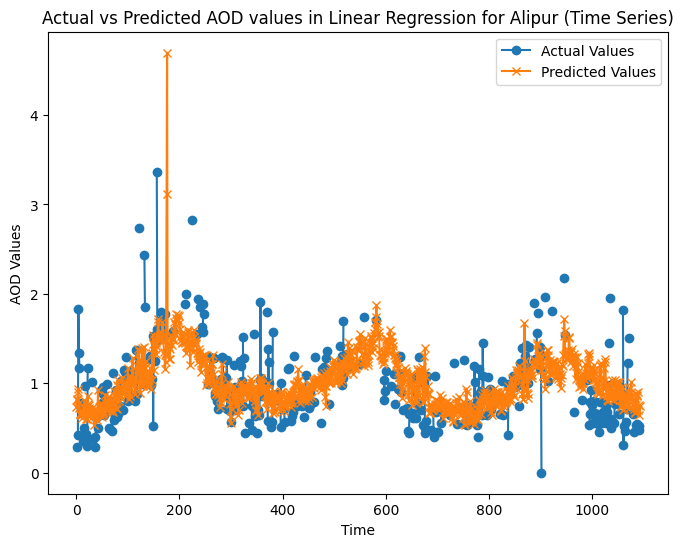

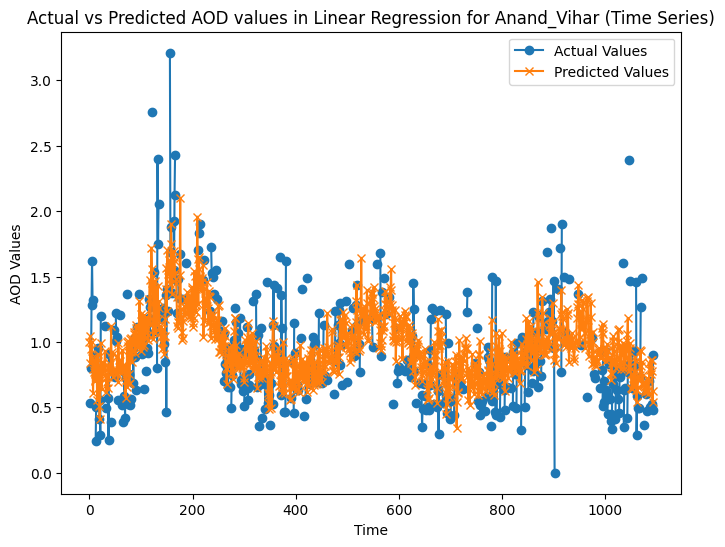

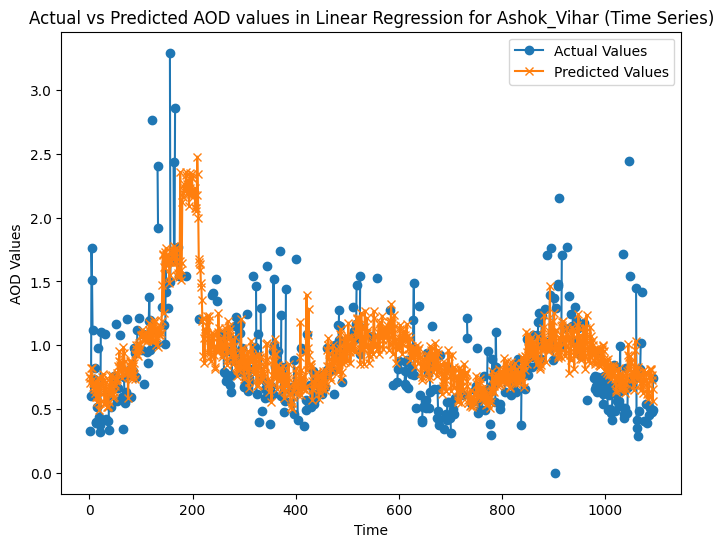

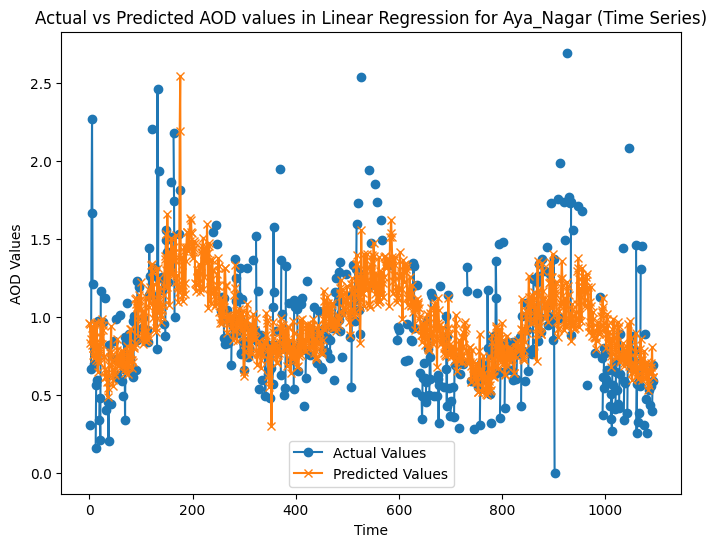

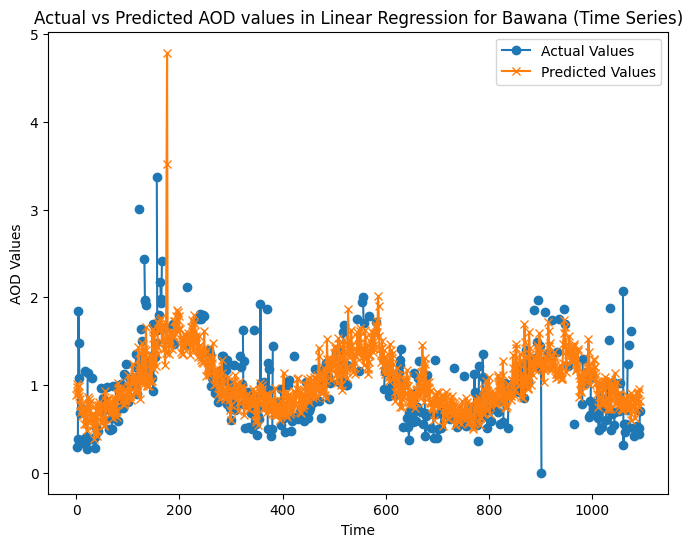

...

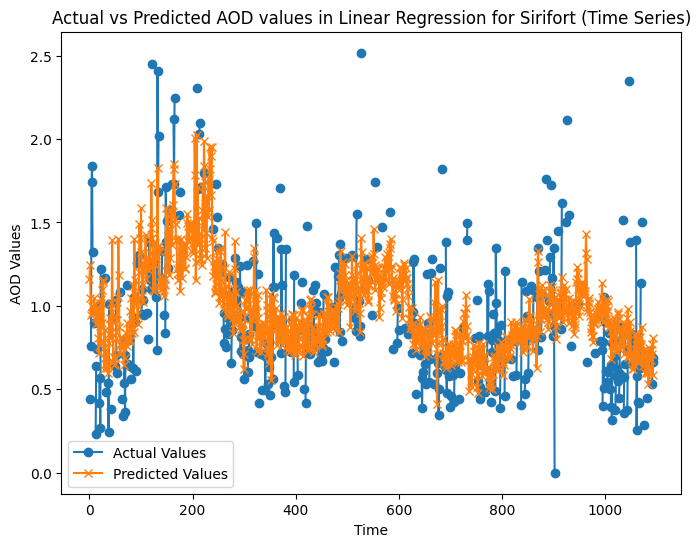

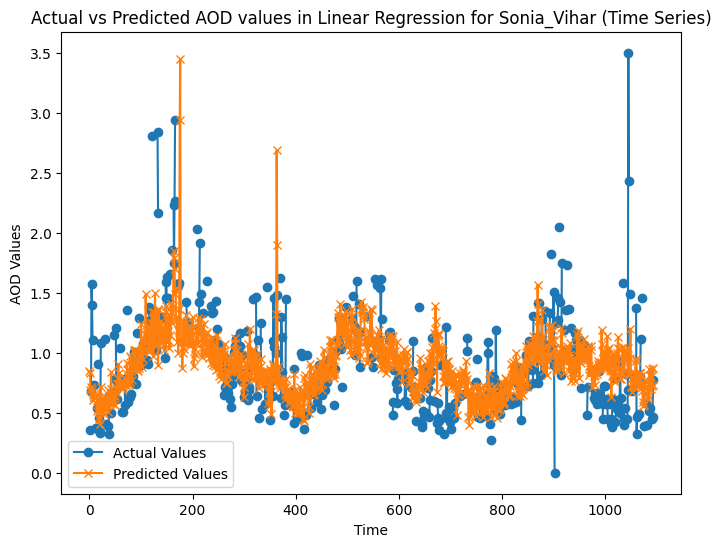

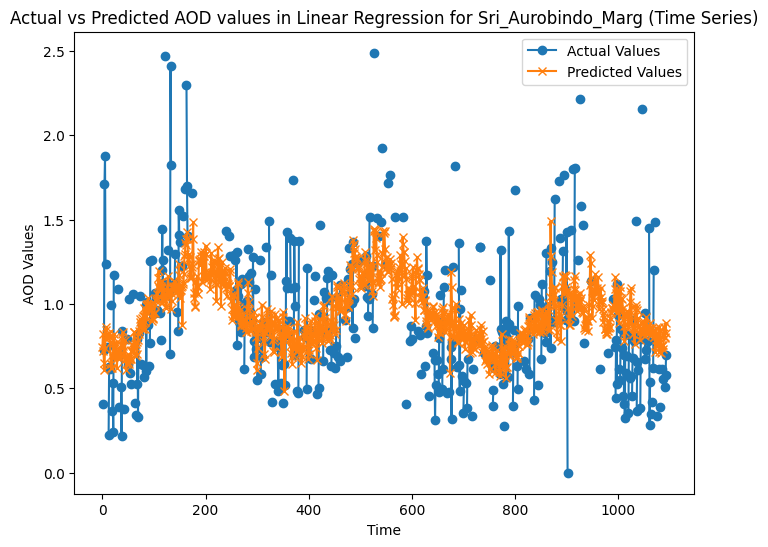

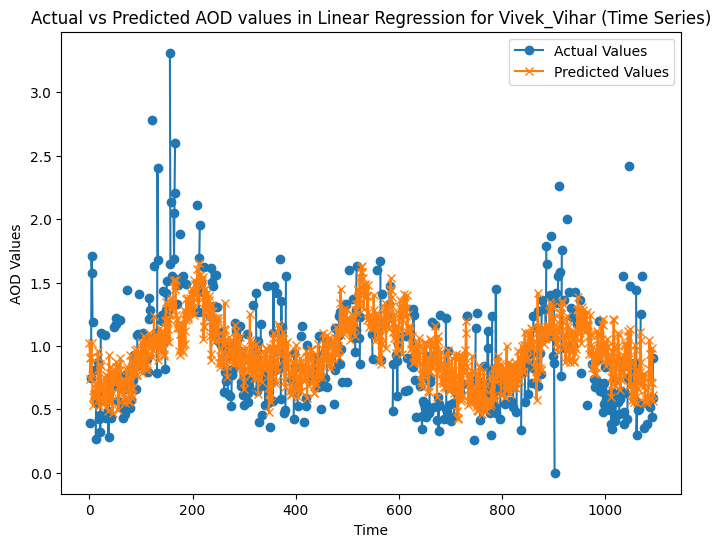

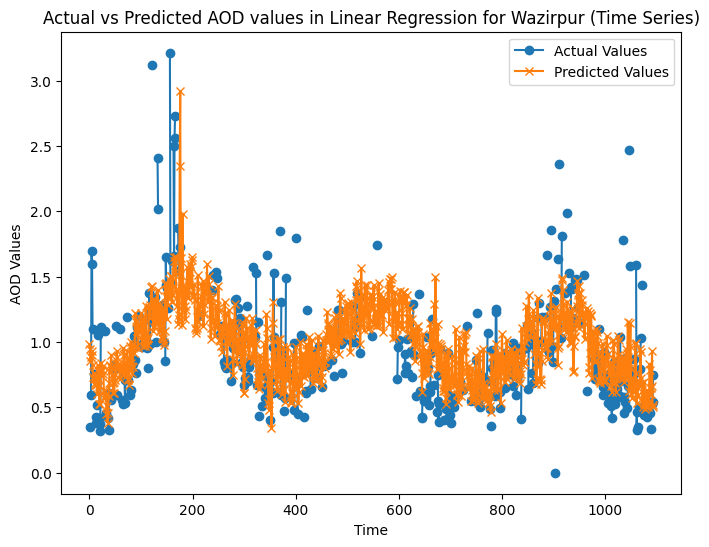

In [65]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Iterate over each location and fit linear regression to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    predicted_aod_values = []
    actual_aod_values = []
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit linear regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the linear regression model
            model = LinearRegression()
            model.fit(X_valid, y_valid)

            # Predict AOD values where AOD is NaN
            predicted_aod_value = model.predict(X[j, i, :].reshape(1, -1))
            actual_aod_value = y[j, i]
            predicted_aod_values.append(predicted_aod_value)
            actual_aod_values.append(actual_aod_value)

    # Create a line plot for actual and predicted AOD values over time for the current station
    plt.figure(figsize=(8, 6))
    plt.plot(range(len(actual_aod_values)), actual_aod_values, label='Actual Values', marker='o')
    plt.plot(range(len(predicted_aod_values)), predicted_aod_values, label='Predicted Values', marker='x')
    plt.xlabel('Time')
    plt.ylabel('AOD Values')
    plt.title(f'Actual vs Predicted AOD values in Linear Regression for {station} (Time Series)')
    plt.legend()
    plt.show()

# Random forest regressors

In [66]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

# Create a dictionary to store R-squared values for each station
r_squared_values = {}

# Iterate over each location and fit Random Forest Regressor to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    station_r_squared_values = []  # List to store R-squared values for each station
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit Random Forest Regressor and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the Random Forest Regressor model
            model = RandomForestRegressor()
            model.fit(X_valid, y_valid)

            # Calculate R-squared value
            r_squared = model.score(X_valid, y_valid)
            station_r_squared_values.append(r_squared)

            # Predict AOD values where AOD is NaN
            predicted_aod[j, i] = model.predict(X[j, i, :].reshape(1, -1))

    # Store the R-squared value for the current station
    r_squared_values[station] = np.mean(station_r_squared_values)

# Print the R-squared values for each station
for station, r_squared in r_squared_values.items():
    print(f"R-squared value for station {station}: {r_squared}")

# Display the predicted AOD values
print(predicted_aod)

# Print the average R-squared value for all stations
print(f"Average R-squared value for all stations: {np.mean(list(r_squared_values.values()))}")

R-squared value for station Alipur: 0.8954810749132732
R-squared value for station Anand_Vihar: 0.8893940054673131
R-squared value for station Ashok_Vihar: 0.9056403476651824
R-squared value for station Aya_Nagar: 0.8916907436364926
R-squared value for station Bawana: 0.9037760055069854
R-squared value for station Burari_Crossing: 0.9080363325235455
R-squared value for station CRRI_Mathura_Road: 0.904422784646157
R-squared value for station Dr_Karni_Singh_Shooting_Range: 0.9095979434880486
R-squared value for station DTU: 0.9028201237811379
R-squared value for station Dwarka_Sector_8: 0.8975779908751913
R-squared value for station East_Arjun_Nagar: 0.8957820842670953
R-squared value for station IGI_Airport_T3: 0.8992545423915815
R-squared value for station IHBAS: 0.8934027276218199
R-squared value for station ITO: 0.9034450827738519
R-squared value for station Jahangirpuri: 0.8996952717759221
R-squared value for station Jawaharlal_Nehru_Stadium: 0.8956043534069437
R-squared value for s

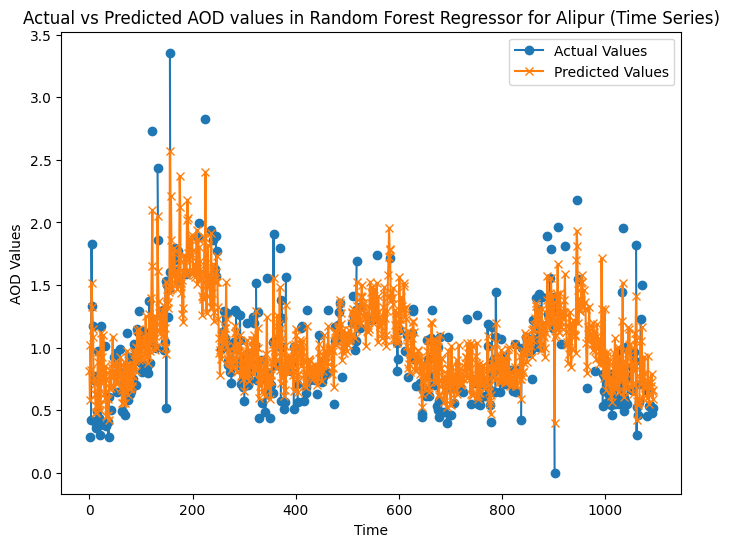

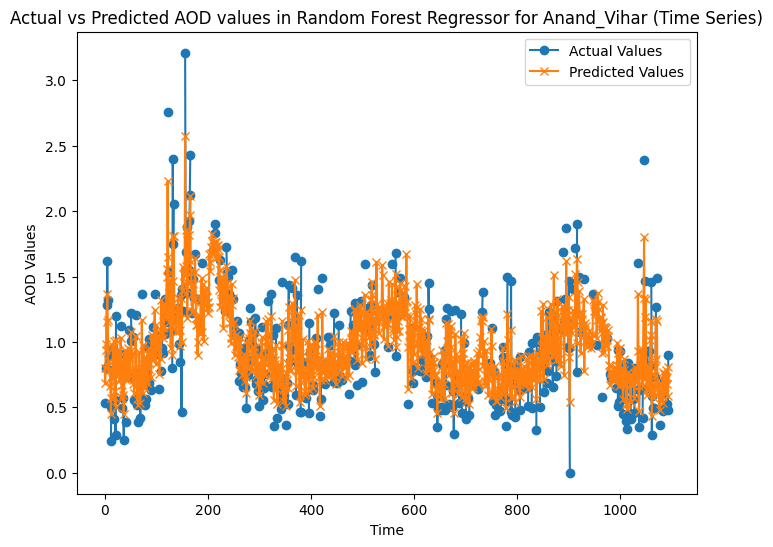

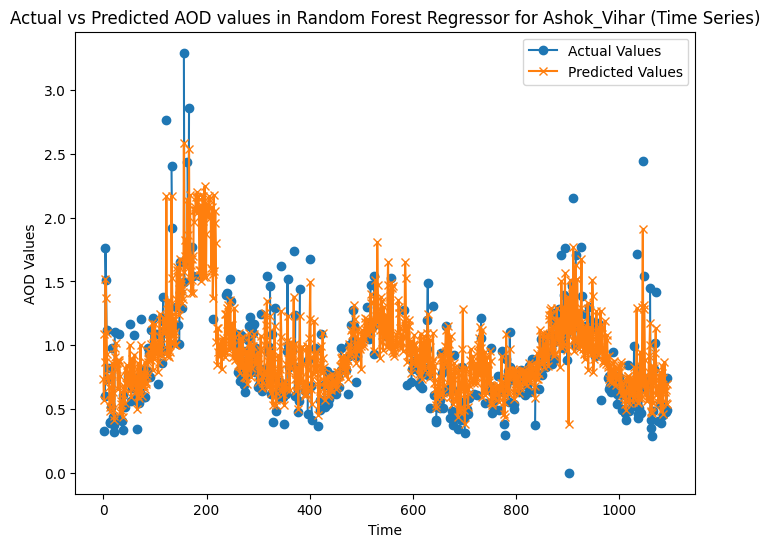

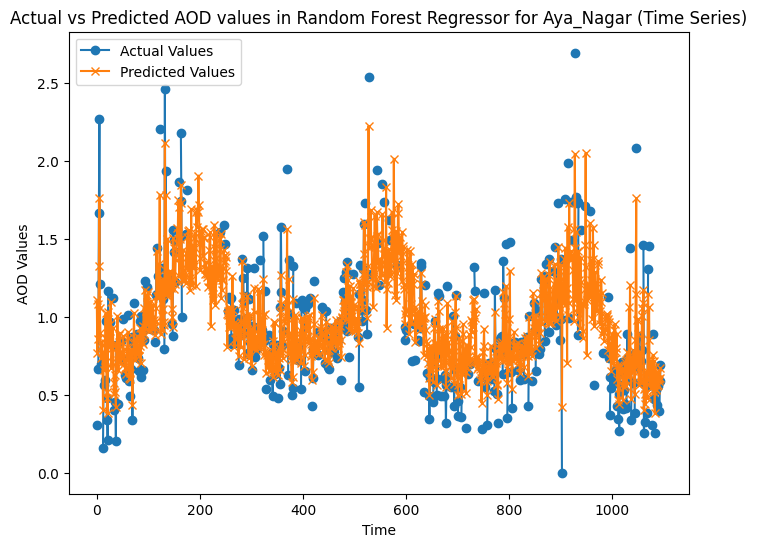

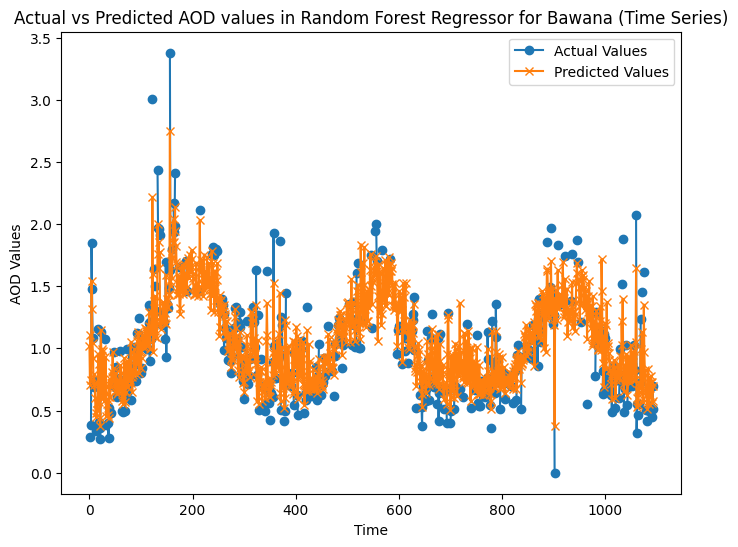

...

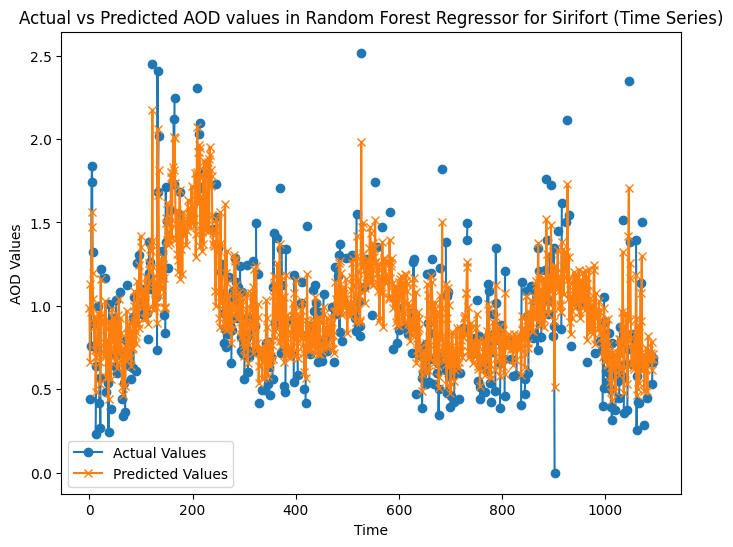

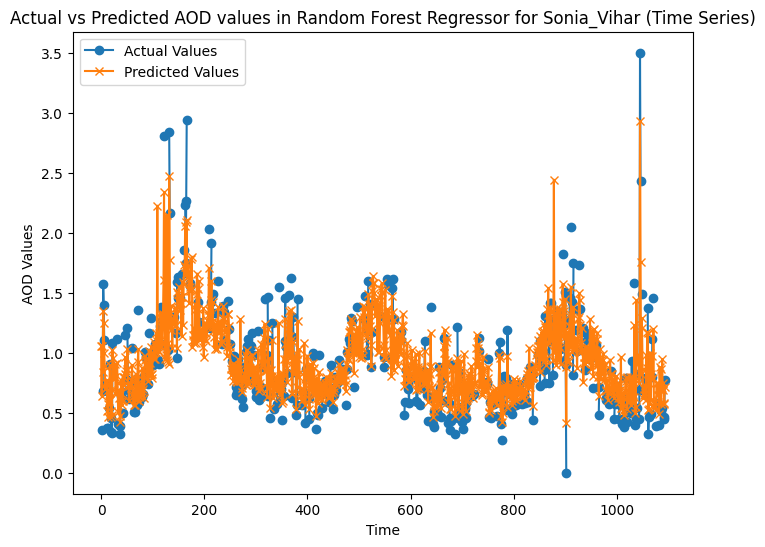

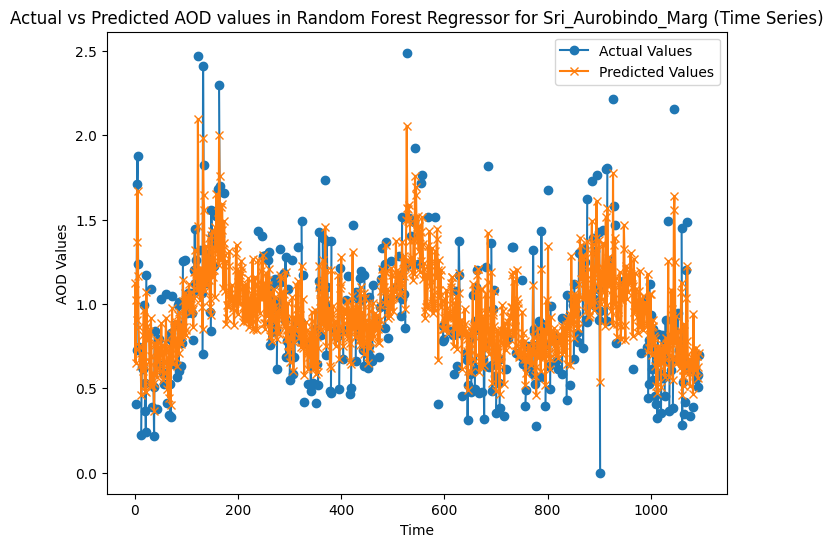

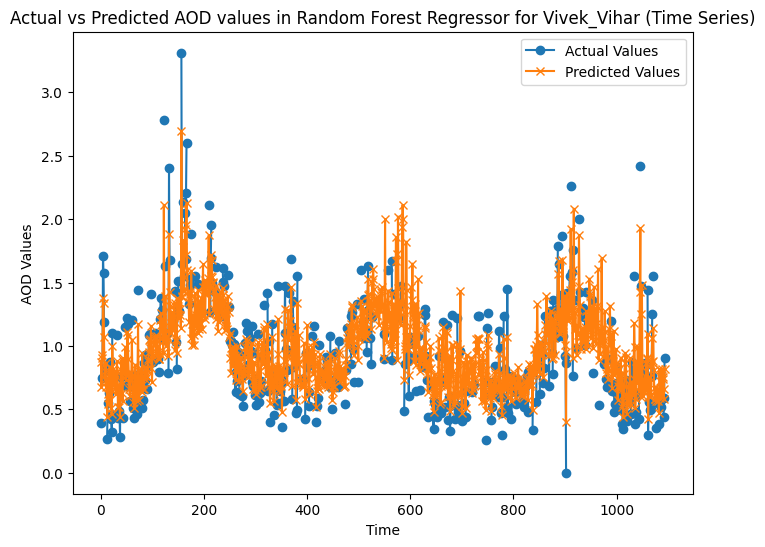

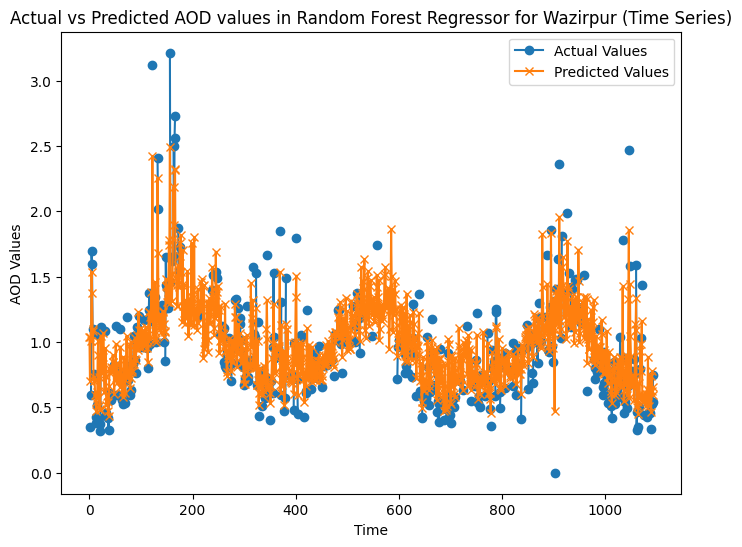

In [67]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Iterate over each location and fit Random Forest Regressor to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    predicted_aod_values = []
    actual_aod_values = []
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit Random Forest Regressor and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the Random Forest Regressor model
            model = RandomForestRegressor()
            model.fit(X_valid, y_valid)

            # Predict AOD values where AOD is NaN
            predicted_aod_value = model.predict(X[j, i, :].reshape(1, -1))
            actual_aod_value = y[j, i]
            predicted_aod_values.append(predicted_aod_value)
            actual_aod_values.append(actual_aod_value)

    # Create a line plot for actual and predicted AOD values over time for the current station
    plt.figure(figsize=(8, 6))
    plt.plot(range(len(actual_aod_values)), actual_aod_values, label='Actual Values', marker='o')
    plt.plot(range(len(predicted_aod_values)), predicted_aod_values, label='Predicted Values', marker='x')
    plt.xlabel('Time')
    plt.ylabel('AOD Values')
    plt.title(f'Actual vs Predicted AOD values in Random Forest Regressor for {station} (Time Series)')
    plt.legend()
    plt.show()


# support vector regressor

In [68]:
from sklearn.svm import SVR
import numpy as np

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

# Create a dictionary to store R-squared values for each station
r_squared_values = {}

# Iterate over each location and fit SVM regression to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    station_r_squared_values = []  # List to store R-squared values for each station
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit SVM regression and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the SVM regression model
            model = SVR()
            model.fit(X_valid, y_valid)

            # Calculate R-squared value
            r_squared = model.score(X_valid, y_valid)
            station_r_squared_values.append(r_squared)

            # Predict AOD values where AOD is NaN
            predicted_aod[j, i] = model.predict(X[j, i, :].reshape(1, -1))

    # Store the R-squared value for the current station
    r_squared_values[station] = np.mean(station_r_squared_values)

# Print the R-squared values for each station
for station, r_squared in r_squared_values.items():
    print(f"R-squared value for station {station}: {r_squared}")

# Display the predicted AOD values
print(predicted_aod)

# Print the average R-squared value for all stations
print(f"Average R-squared value for all stations: {np.mean(list(r_squared_values.values()))}")


R-squared value for station Alipur: -0.017770639578068348
R-squared value for station Anand_Vihar: -0.026422494492878812
R-squared value for station Ashok_Vihar: -0.02950411725035451
R-squared value for station Aya_Nagar: -0.013234342132107502
R-squared value for station Bawana: -0.01923550206567959
R-squared value for station Burari_Crossing: -0.031020238905297367
R-squared value for station CRRI_Mathura_Road: -0.022287120487667123
R-squared value for station Dr_Karni_Singh_Shooting_Range: -0.03152793131525544
R-squared value for station DTU: -0.014324822304035312
R-squared value for station Dwarka_Sector_8: -0.011235082203451263
R-squared value for station East_Arjun_Nagar: -0.022454896541637792
R-squared value for station IGI_Airport_T3: -0.029038276605248825
R-squared value for station IHBAS: -0.030358109339638784
R-squared value for station ITO: -0.019945048694451684
R-squared value for station Jahangirpuri: -0.01891379248337466
R-squared value for station Jawaharlal_Nehru_Stadium

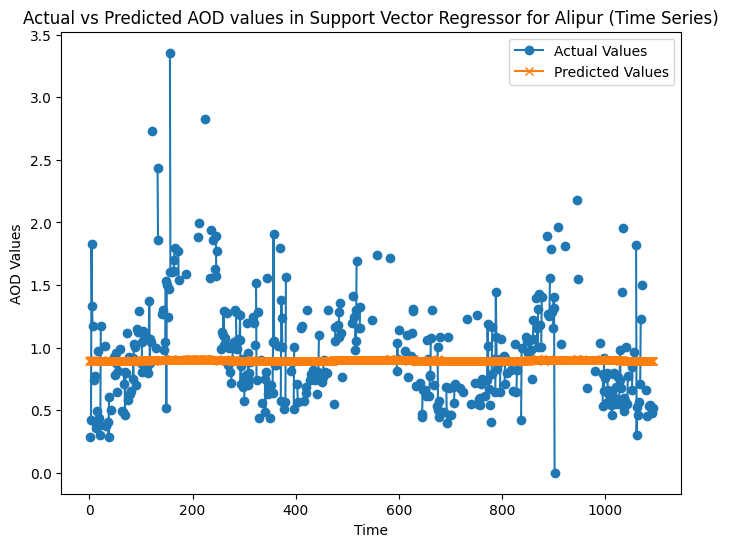

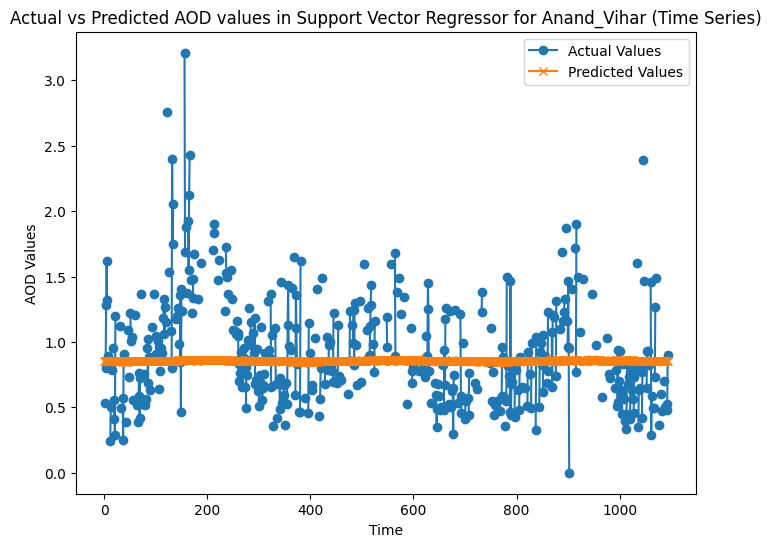

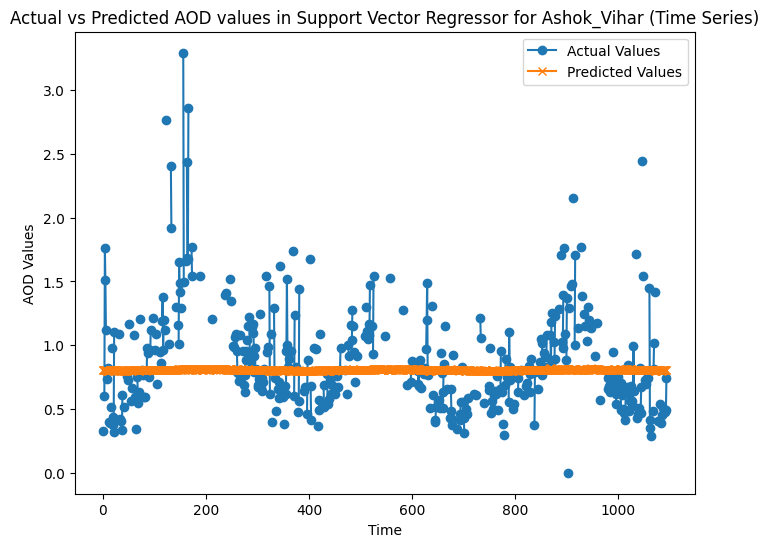

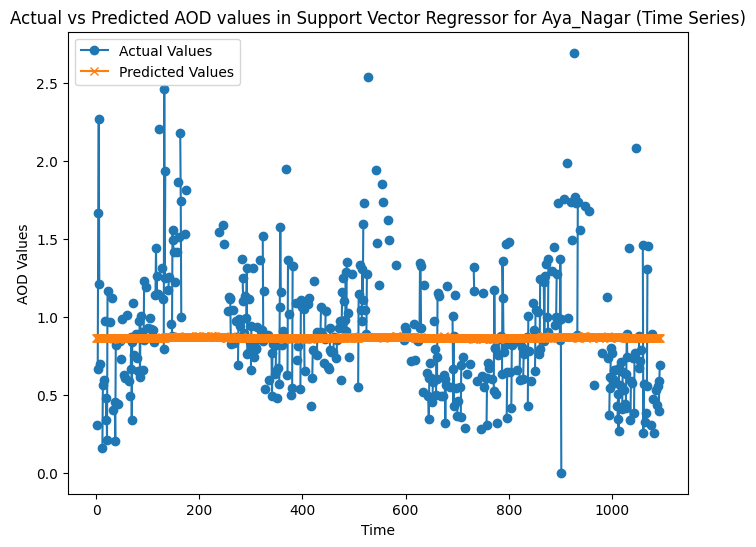

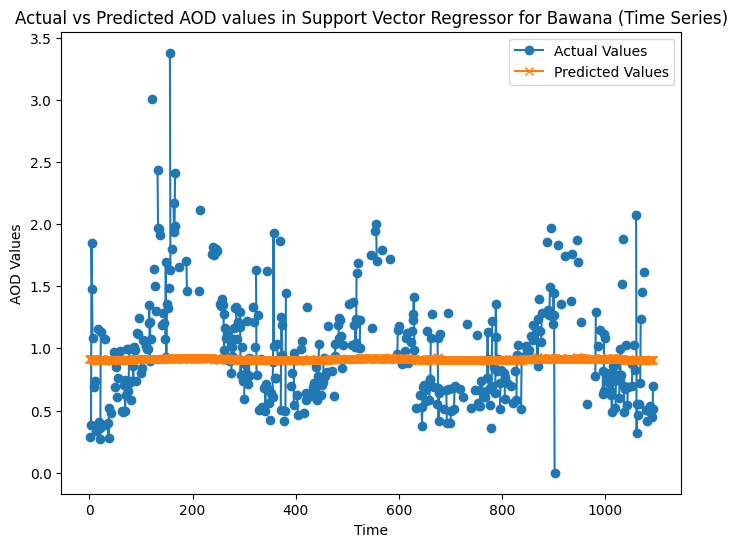

...

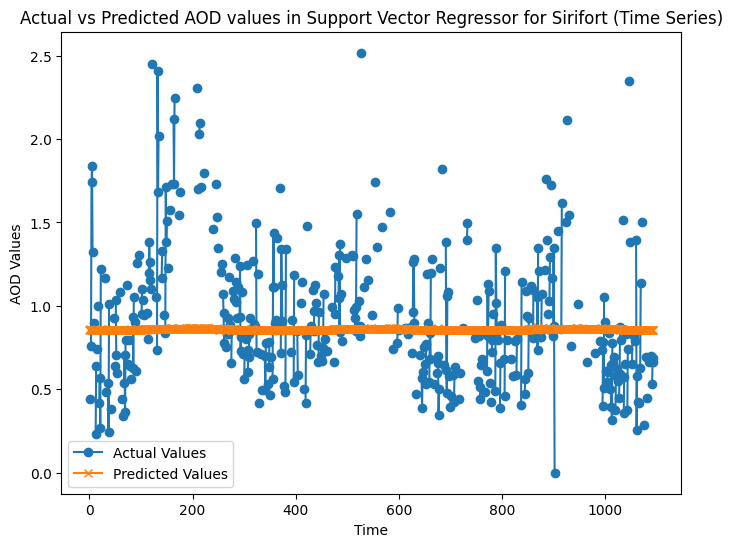

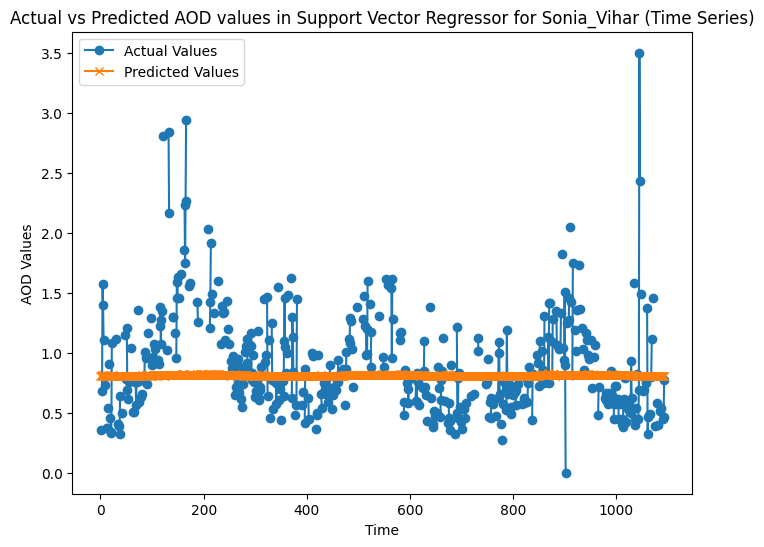

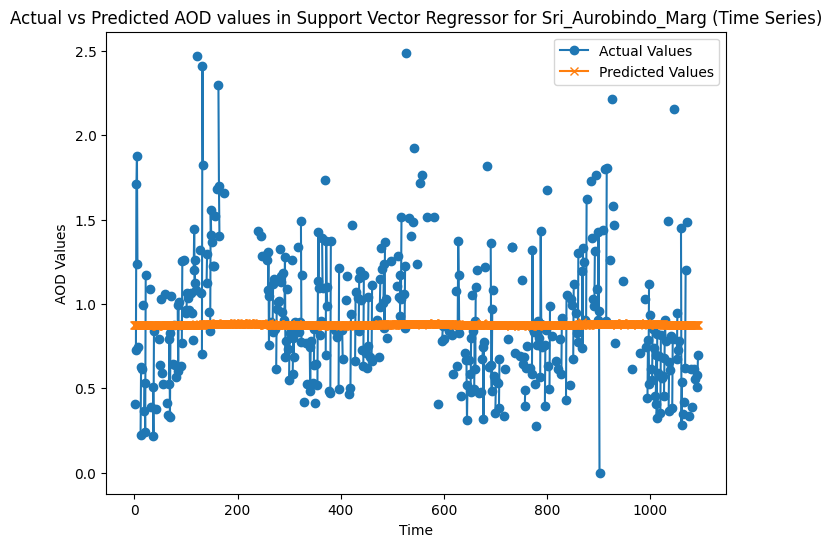

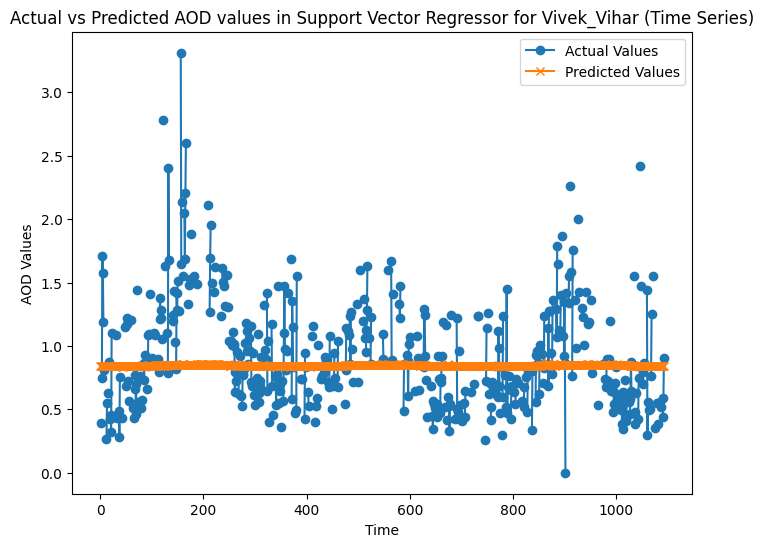

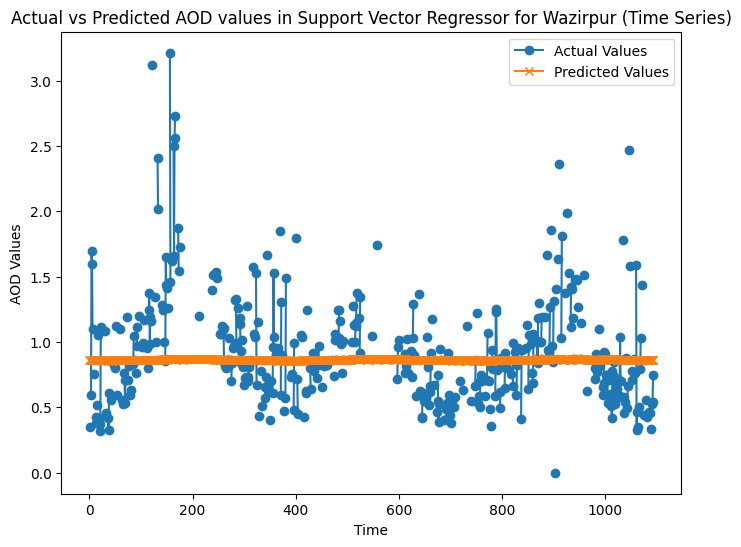

In [69]:
from sklearn.svm import SVR
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_data is your data array
# Extract features and target for regression
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Iterate over each location and fit SVR to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    predicted_aod_values = []
    actual_aod_values = []
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit SVR and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the SVR model
            model = SVR()
            model.fit(X_valid, y_valid)

            # Predict AOD values where AOD is NaN
            predicted_aod_value = model.predict(X[j, i, :].reshape(1, -1))
            actual_aod_value = y[j, i]
            predicted_aod_values.append(predicted_aod_value)
            actual_aod_values.append(actual_aod_value)

    # Create a line plot for actual and predicted AOD values over time for the current station
    plt.figure(figsize=(8, 6))
    plt.plot(range(len(actual_aod_values)), actual_aod_values, label='Actual Values', marker='o')
    plt.plot(range(len(predicted_aod_values)), predicted_aod_values, label='Predicted Values', marker='x')
    plt.xlabel('Time')
    plt.ylabel('AOD Values')
    plt.title(f'Actual vs Predicted AOD values in Support Vector Regressor for {station} (Time Series)')
    plt.legend()
    plt.show()


# MLP regressor

In [ ]:
from sklearn.neural_network import MLPRegressor
import numpy as np

# Assuming combined_data is your data array
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Create a new array to store predicted AOD values
predicted_aod = np.zeros_like(y)

# Create a dictionary to store R-squared values for each station
r_squared_values = {}

# Iterate over each location and fit MLP Regressor to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    station_r_squared_values = []  # List to store R-squared values for each station
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit MLP Regressor and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the MLP Regressor model
            model = MLPRegressor()
            model.fit(X_valid, y_valid)

            # Calculate R-squared value
            r_squared = model.score(X_valid, y_valid)
            station_r_squared_values.append(r_squared)

            # Predict AOD values where AOD is NaN
            predicted_aod[j, i] = model.predict(X[j, i, :].reshape(1, -1))

    # Store the R-squared value for the current station
    r_squared_values[station] = np.mean(station_r_squared_values)

# Print the R-squared values for each station
for station, r_squared in r_squared_values.items():
    print(f"R-squared value for station {station}: {r_squared}")

# Display the predicted AOD values
print(predicted_aod)

# Print the average R-squared value for all stations
print(f"Average R-squared value for all stations: {np.mean(list(r_squared_values.values()))}")


/home/sysadm/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/sysadm/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/sysadm/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/sysadm/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/sysadm/.local/lib/python3.10/site-packages

In [ ]:
from sklearn.neural_network import MLPRegressor
import numpy as np
import matplotlib.pyplot as plt

# Assuming combined_data is your data array
X = combined_data[:, :, :-1]  # Features are all columns except the last one
y = combined_data[:, :, -1]  # Target variable is the last column

# Iterate over each location and fit MLP Regressor to predict AOD
for i, station in enumerate(monitoring_system_data["Staton_name"]):
    predicted_aod_values = []
    actual_aod_values = []
    for j in range(y.shape[0]):
        # Find indices where AOD is not NaN
        valid_indices = ~np.isnan(y[:, i])

        # If there are valid AOD values, fit MLP Regressor and predict missing AOD
        if np.sum(valid_indices) > 0:
            X_valid = X[valid_indices, i, :]
            y_valid = y[valid_indices, i]

            # Create and fit the MLP Regressor model
            model = MLPRegressor()
            model.fit(X_valid, y_valid)

            # Predict AOD values where AOD is NaN
            predicted_aod_value = model.predict(X[j, i, :].reshape(1, -1))
            actual_aod_value = y[j, i]
            predicted_aod_values.append(predicted_aod_value)
            actual_aod_values.append(actual_aod_value)

    # Create a line plot for actual and predicted AOD values over time for the current station
    plt.figure(figsize=(8, 6))
    plt.plot(range(len(actual_aod_values)), actual_aod_values, label='Actual Values', marker='o')
    plt.plot(range(len(predicted_aod_values)), predicted_aod_values, label='Predicted Values', marker='x')
    plt.xlabel('Time')
    plt.ylabel('AOD Values')
    plt.title(f'Actual vs Predicted AOD values in MLP Regressor for {station} (Time Series)')
    plt.legend()
    plt.show()


# voronoi diagram

In [ ]:
import pandas as pd
from scipy.spatial import Voronoi, voronoi_plot_2d
import matplotlib.pyplot as plt

# Coordinates of the satellite station
satellite_coords = satellite_coords

# Coordinates of the monitoring stations
monitoring_station_coords = [(lat, lon) for lat, lon in zip(monitoring_system_data['Latitude'], monitoring_system_data['Longitude'])]

# Combine the satellite and monitoring station coordinates
combined_coords = satellite_coords + monitoring_station_coords

# Compute the Voronoi tessellation
vor = Voronoi(combined_coords)

# Plot the Voronoi tessellation
voronoi_plot_2d(vor)
for coord in satellite_coords:
    plt.scatter(coord[0], coord[1], color='r', label='Satellite Station')
plt.scatter(monitoring_system_data['Latitude'], monitoring_system_data['Longitude'], color='b', label='Monitoring Stations')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.legend()
plt.show()
